# <span style="color:blue"> Projet Machine Learning

### <span style="color:blue"> Auteurs: Paul Delon, Maïmouna Gadji, Achille Pommier, Tidiane Sall

# <span style="color:blue"> Introduction

**Le jeu de données "Energy" couvre la période de 2000 à 2020 et fournit des informations détaillées sur la consommation énergétique et la géographie de 176 pays. Avec 3649 observations et 21 variables, telles que l'accès à l'électricité, la part des énergies renouvelables utilisée, ou encore la superficie du pays, notre objectif est de prédire la variable "Value-co2-emissions" indiquant la valeur de CO2 émis d'un pays sur un an. Dans cette étude, nous cherchons à évaluer les performances des modèles d'apprentissage automatique à savoir les modèles linéaires, les "Support Vector Machine" (SVM), l'arbre de décision (CART), Random Forest, les Réseaux de Neurones et enfin le Boosting pour atteindre cet objectif.**

In [1]:
install.packages("plotly")
install.packages("maps")

Installation du package dans ‘/home/tsall/R/libs’
(car ‘lib’ n'est pas spécifié)

Installation du package dans ‘/home/tsall/R/libs’
(car ‘lib’ n'est pas spécifié)



In [3]:
#SUPRESSIONS DES WARNING
options(warn = -1)
#options(warn = 0) #pour la réactivation

In [2]:
library(ggplot2)
library(tidyverse)
library(gridExtra)
library(GGally)
library(plotly)
library(corrplot)
library(reshape2)
library(FactoMineR) 
library(factoextra)
library(glmnet) 
library(ggfortify)
library(pROC)
library(maps)
library(plotly)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.0     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ lubridate 1.9.3     ✔ tibble    3.2.1
✔ purrr     1.0.1     ✔ tidyr     1.3.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ purrr::%||%()   masks base::%||%()
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attachement du package : ‘gridExtra’


L'objet suivant est masqué depuis ‘package:dplyr’:

    combine


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


Attachement du package : ‘plotly’


L'objet suivant est masqué depuis ‘package:ggplot2’:

    last_plot


L'objet suivant est masqué depuis ‘package:stats’:

    filter


L'objet suivant est masqué depuis ‘package:graphics’:

    layout


corrplot 0.92 loaded


Attachement 

In [4]:
# on importe les données et on regarde leurs natures (qualitatives ou quantitatives)
energy <- read.table("energy.txt", sep = ",", header = TRUE)
head(energy)
summary(energy)

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.electricity.generating.capacity.per.capita,Financial.flows.to.developing.countries..US...,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,⋯,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,Renewables....equivalent.primary.energy.,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


    Entity               Year      Access.to.electricity....of.population.
 Length:3649        Min.   :2000   Min.   :  1.252                        
 Class :character   1st Qu.:2005   1st Qu.: 59.801                        
 Mode  :character   Median :2010   Median : 98.362                        
                    Mean   :2010   Mean   : 78.934                        
                    3rd Qu.:2015   3rd Qu.:100.000                        
                    Max.   :2020   Max.   :100.000                        
                                   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

# <span style="color:blue"> I. Nettoyage des données

**On remarque que la variable Year est une variable quantitative. On la transforme alors en variable qualitative.
Au contraite, la variable Density étant de type "character", nous la transformons en variable de type numérique.**

In [5]:
energy$Year <- as.factor(energy$Year)
energy$Density.n.P.Km2. <- as.numeric(gsub(",", "", energy$Density.n.P.Km2.))
summary(energy)

    Entity               Year      Access.to.electricity....of.population.
 Length:3649        2013   : 175   Min.   :  1.252                        
 Class :character   2014   : 175   1st Qu.: 59.801                        
 Mode  :character   2015   : 175   Median : 98.362                        
                    2016   : 175   Mean   : 78.934                        
                    2017   : 175   3rd Qu.:100.000                        
                    2018   : 175   Max.   :100.000                        
                    (Other):2599   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

 **On regarde maintenant le pourcentage de données manquantes pour chaque variable. Nous allons procéder à l'élimination des variables "Renewables", "Financial flows to developing countries" et "Renewable-electricity-generating-capacity-per-capita" en raison de leur taux élevé de données manquantes, situé entre 25 % et 60 %.**

In [6]:
missing_data <- colMeans(is.na(energy)) * 100

sorted_missing_data <- sort(missing_data, decreasing = TRUE)

cat("Pourcentage de données manquantes par variable (ordre décroissant):\n")
for (i in seq_along(sorted_missing_data)) {
  cat(names(sorted_missing_data)[i], ": ", sprintf("%.2f", sorted_missing_data[i]), "%\n")
}
energy <- subset(energy, select = -Renewable.electricity.generating.capacity.per.capita)
energy <- subset(energy, select = -Financial.flows.to.developing.countries..US...)
energy <- subset(energy, select =  -Renewables....equivalent.primary.energy.)
head(energy)

Pourcentage de données manquantes par variable (ordre décroissant):
Renewables....equivalent.primary.energy. :  58.56 %
Financial.flows.to.developing.countries..US... :  57.25 %
Renewable.electricity.generating.capacity.per.capita :  25.51 %
Value_co2_emissions_kt_by_country :  11.73 %
gdp_growth :  8.69 %
gdp_per_capita :  7.73 %
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. :  5.67 %
Renewable.energy.share.in.the.total.final.energy.consumption.... :  5.32 %
Access.to.clean.fuels.for.cooking :  4.63 %
Electricity.from.nuclear..TWh. :  3.45 %
Low.carbon.electricity....electricity. :  1.15 %
Electricity.from.fossil.fuels..TWh. :  0.58 %
Electricity.from.renewables..TWh. :  0.58 %
Access.to.electricity....of.population. :  0.27 %
Density.n.P.Km2. :  0.03 %
Land.Area.Km2. :  0.03 %
Latitude :  0.03 %
Longitude :  0.03 %
Entity :  0.00 %
Year :  0.00 %
Primary.energy.consumption.per.capita..kWh.person. :  0.00 %


,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,44.99,0.16,0,0.31,65.95744,302.5948,1.64,760,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,45.60,0.09,0,0.50,84.74577,236.8919,1.74,730,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,37.83,0.13,0,0.56,81.15942,210.8622,1.40,1030,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,36.66,0.31,0,0.63,67.02128,229.9682,1.40,1220,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,44.24,0.33,0,0.56,62.92135,204.2312,1.20,1030,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,33.88,0.34,0,0.59,63.44086,252.0691,1.41,1550,11.229715,242.0313,60,652230,33.93911,67.70995


**Ensuite, nous supprimons tous les individus présentant des valeurs non disponibles (NaN) pour les variables restantes. Cette étape nous permet de conserver 2868 individus avec 18 variables.**

In [7]:
energy <- na.omit(energy)
dim(energy)

[1] 2868   18

**On supprime également la variable Electricity from fossil fuels (TWh). Cette variable étant très corrélée avec la variable à prédire, on l'enlève ici uniquement dans un but pédagogique (pour éviter de tros bonnes prédictions seulement provoquées par la Electricity from fossil fuels et pouvoir analyser l'impact des autres variables).**

In [8]:
energy <- energy[,-6]

# <span style="color:blue"> II. Analyse descriptive 

## <span style="color:blue"> II.1 Analyse unidimensionnelle

**Obervons l'émission de c02 par pays.**

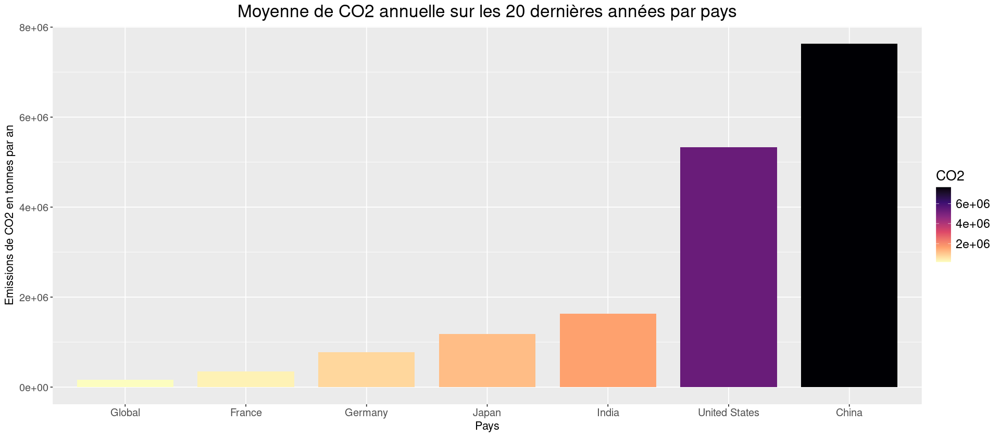

In [9]:
options(repr.plot.width = 16)
df <- energy$Value_co2_emissions_kt_by_country
df <-  matrix(df, nrow = 2868)
df <- as.data.frame(df)
colnames(df) = list("CO2")
df$Country <- energy$Entity
df_mean <- summarise(group_by(df, Country), mean_value = mean(CO2))
CO2 <- df_mean$mean_value
Country <- df_mean$Country
df <- data.frame(Country = Country, CO2 = CO2)
fr <- df[48,] ## France
df <- arrange(df, desc(CO2))
top_5 <- head(df, 5)
last_5 <- tail(df,5)
moyenne <- mean(df$CO2)
mean <- data.frame("Country" = "Global", "CO2" = moyenne)
df <- rbind(top_5, fr)
df <- rbind(df,mean)
#df <- rbind(df,last_5)
ggplot(df, aes(x=reorder(Country, CO2), y=CO2, fill=CO2)) +
  geom_bar(stat = "identity", position = "stack", width = 0.8) +
  labs(title = "Moyenne de CO2 annuelle sur les 20 dernières années par pays", x = "Pays", y = "Emissions de CO2 en tonnes par an") +
  theme(plot.title = element_text(size = 20, hjust = 0.5), 
        axis.text.y = element_text(size = 12),
        axis.title.y = element_text(size = 13),
        axis.text.x = element_text(size = 12),
       axis.title.x = element_text(size = 13),
       legend.text = element_text(size = 14),  
       legend.title = element_text(size = 16), 
       legend.position = "right") + 
       scale_fill_viridis_c(option = "A", direction = -1)

**On peut voir que les 5 pays les plus émetteurs sont la Chine, les Etats-Unis, l'Inde, le Japon et l'Allemagne. On a décidé d'observer également les émissions moyennes de CO2 de la France ainsi que la moyenne globale de tous les pays. Sur le graphe du dessous, on représente sur la carte du monde cette moyenne d'émission pour chaque pays.**

Le chargement a nécessité le package : viridisLite


Attachement du package : ‘viridis’


L'objet suivant est masqué depuis ‘package:maps’:

    unemp




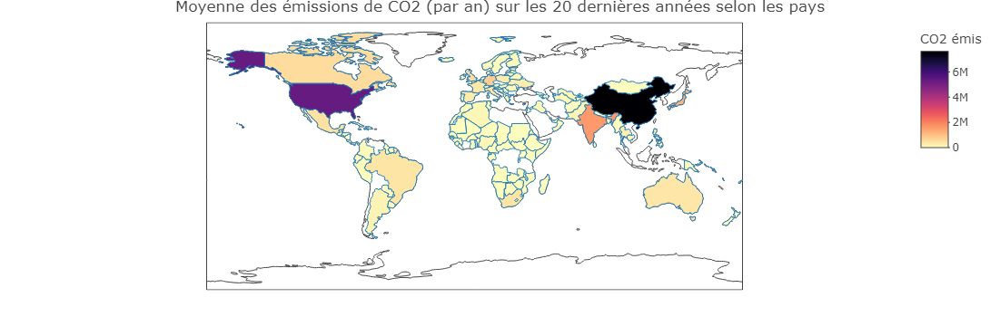

In [10]:
library(viridis)
options(repr.plot.width = 16)
dfa <- energy$Value_co2_emissions_kt_by_country
dfa <-  matrix(dfa, nrow = 2868)
dfa <- as.data.frame(dfa)
colnames(dfa) = list("CO2")
dfa$Country <- energy$Entity
df_mean <- summarise(group_by(dfa, Country), mean_value = mean(CO2))
CO2 <- df_mean$mean_value
Country <- df_mean$Country
dfa <- data.frame(Country = Country, CO2 = CO2)
plot_ly(data = dfa, type = "choropleth", locations = ~Country, locationmode = "country names", z = ~CO2, text = ~paste("Country: ", Country, "<br>CO2 emissions (metric tons per year): ", CO2),colors = viridis(100, direction = -1, option ="A")) %>%
  colorbar(title = "CO2 émis",colors = viridis(100, direction = -1, option ="A")) %>%
  layout(title = "Moyenne des émissions de CO2 (par an) sur les 20 dernières années selon les pays")

**On regarde la distribution de nos variables. On va transformer les variables pour essayer de les faire ressembler à des gaussiennes.Pour celà on applique des transformations logarithmiques ou racine carrées.**

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwid

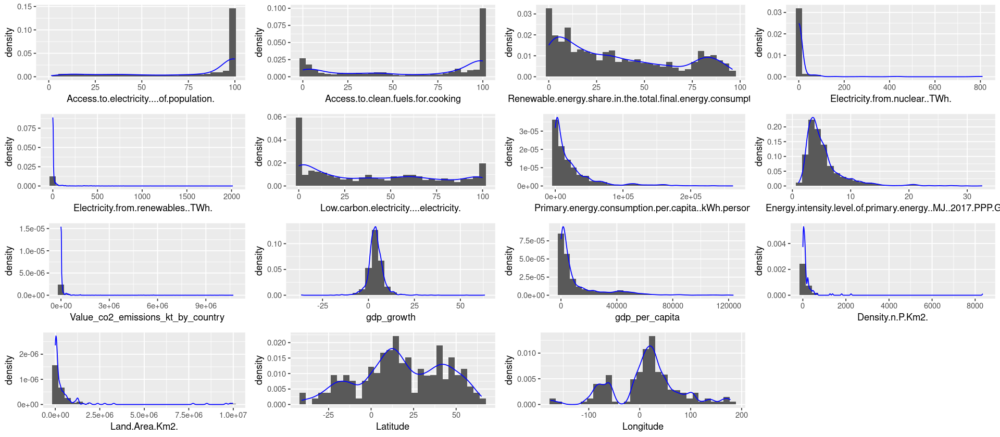

In [11]:
## que des variables quantitatives mis à part Entity et Year
g1<-ggplot(energy,aes(x=Access.to.electricity....of.population.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g2<-ggplot(energy,aes(x=Access.to.clean.fuels.for.cooking))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g3<-ggplot(energy,aes(x=Renewable.energy.share.in.the.total.final.energy.consumption....))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g5<-ggplot(energy,aes(x=Electricity.from.nuclear..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g6<-ggplot(energy,aes(x=Electricity.from.renewables..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g7<-ggplot(energy,aes(x=Low.carbon.electricity....electricity.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g8<-ggplot(energy,aes(x=Primary.energy.consumption.per.capita..kWh.person.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g9<-ggplot(energy,aes(x=Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g10<-ggplot(energy,aes(x=Value_co2_emissions_kt_by_country))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g11<-ggplot(energy,aes(x=gdp_growth))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g12<-ggplot(energy,aes(x=gdp_per_capita))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue")
g13<-ggplot(energy,aes(x=Density.n.P.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g14<-ggplot(energy,aes(x=Land.Area.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g15<-ggplot(energy,aes(x=Latitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g16<-ggplot(energy,aes(x=Longitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
grid.arrange(g1,g2,g3,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16,ncol=4)
rm(g1,g2,g3,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16)

In [12]:
energy[, "Access.to.electricity....of.population."] <- sqrt(energy[, "Access.to.electricity....of.population."])
energy[, "Access.to.clean.fuels.for.cooking"] <- sqrt(energy[, "Access.to.clean.fuels.for.cooking"])
energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."] <- sqrt(energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."])
energy[, "Electricity.from.nuclear..TWh."] <- sqrt(energy[, "Electricity.from.nuclear..TWh."])
energy[, "Electricity.from.renewables..TWh."] <- sqrt(energy[, "Electricity.from.renewables..TWh."])
energy[, "Low.carbon.electricity....electricity."] <- sqrt(energy[, "Low.carbon.electricity....electricity."])
energy[, "Primary.energy.consumption.per.capita..kWh.person."] <- log(energy[, "Primary.energy.consumption.per.capita..kWh.person."])
energy[, "Value_co2_emissions_kt_by_country"] <- log(energy[, "Value_co2_emissions_kt_by_country"])
energy[, "gdp_per_capita"] <- log(energy[, "gdp_per_capita"])
energy[, "Density.n.P.Km2."] <- log(energy[, "Density.n.P.Km2."])
energy[, "Land.Area.Km2."] <- log(energy[, "Land.Area.Km2."]) 

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwid

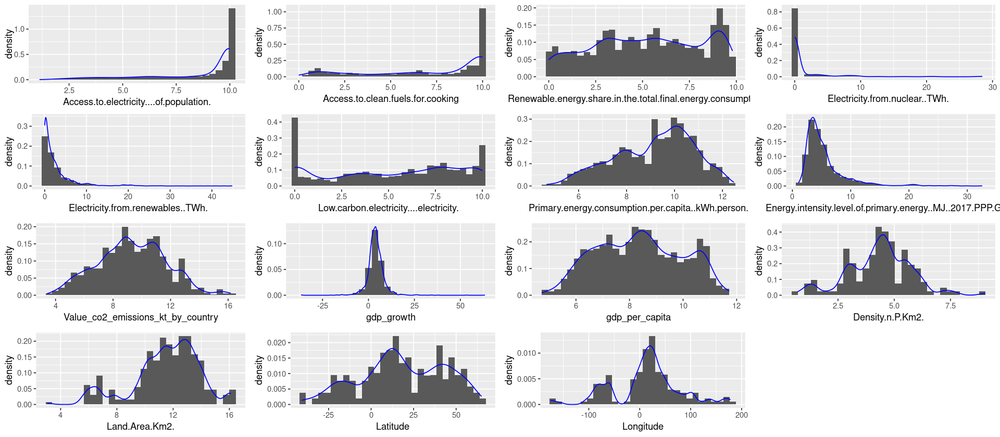

In [13]:
g1<-ggplot(energy,aes(x=Access.to.electricity....of.population.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g2<-ggplot(energy,aes(x=Access.to.clean.fuels.for.cooking))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g3<-ggplot(energy,aes(x=Renewable.energy.share.in.the.total.final.energy.consumption....))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g5<-ggplot(energy,aes(x=Electricity.from.nuclear..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g6<-ggplot(energy,aes(x=Electricity.from.renewables..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g7<-ggplot(energy,aes(x=Low.carbon.electricity....electricity.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g8<-ggplot(energy,aes(x=Primary.energy.consumption.per.capita..kWh.person.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g9<-ggplot(energy,aes(x=Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g10<-ggplot(energy,aes(x=Value_co2_emissions_kt_by_country))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g11<-ggplot(energy,aes(x=gdp_growth))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g12<-ggplot(energy,aes(x=gdp_per_capita))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue")
g13<-ggplot(energy,aes(x=Density.n.P.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g14<-ggplot(energy,aes(x=Land.Area.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g15<-ggplot(energy,aes(x=Latitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g16<-ggplot(energy,aes(x=Longitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
grid.arrange(g1,g2,g3,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16,ncol=4)
rm(g1,g2,g3,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16)

## <span style="color:blue"> II. 2- Analyse multidimensionnelle

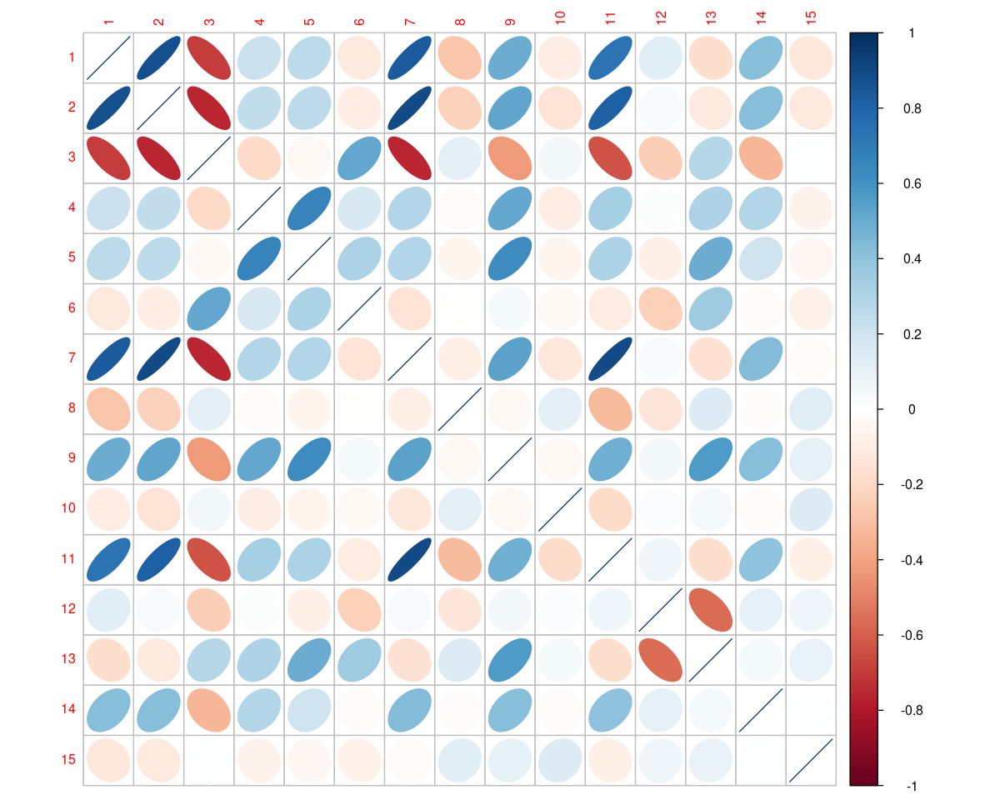

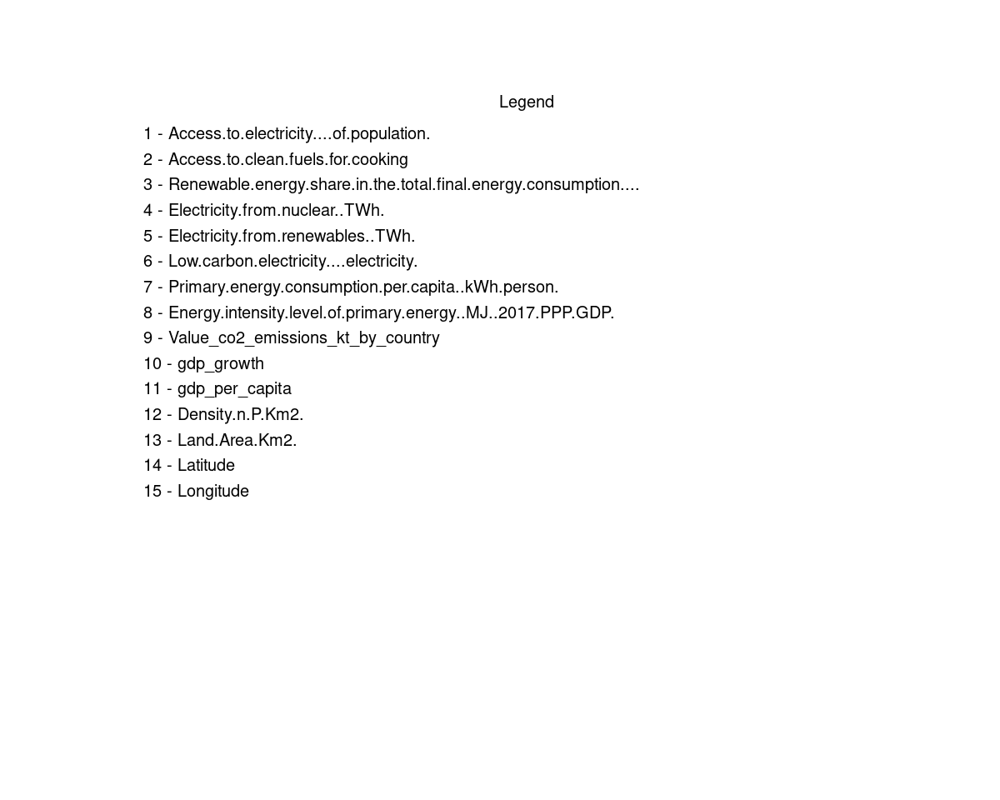

In [14]:
library(corrplot)
options(repr.plot.width = 10, repr.plot.height = 8)
energy2 <- energy
original_names <- colnames(energy2)[3:17]
colnames(energy2)[3:17] <- 1:15

cor_matrix <- cor(energy2[, c(3:17)])

corrplot(cor_matrix, method = "ellipse", tl.cex = 0.8)

plot.new()
legend_names <- c(paste(1:15, " - ",original_names, sep = ""))
legend("topright", legend = legend_names, title = "Legend", cex = 1, bty = "n", col = "black")

**Selon le graphique de corrélation , on observe que la variable à prédire, la quantité d'émissions de CO2 par pays (Value_co2_emissions_kt_by_country), présente une corrélation plus significative avec la production d'électricité à partir de sources renouvelables, et dans une moindre mesure avec la production d'électricité d'origine nucléaire. Cependant, elle affiche une corrélation négative avec la proportion d'énergie renouvelable dans la consommation totale d'électricité.**
**La corrélation observée peut sembler contre-intuitive. Cependant, elle peut être expliquée par le fait que les pays plus riches ont souvent une capacité plus importante à investir dans le nucléaire et les énergies renouvelables. Ainsi, une plus grande production d'électricité à partir de ces sources pourrait être associée à des niveaux d'émissions de CO2 plus élevés, car des niveaux de richesse plus importante.**
**Par ailleurs, la corrélation négative entre les émissions de CO2 et la part d'énergie renouvelable dans la consommation d'électricité souligne l'importance des énergies propres pour réduire ces émissions.**

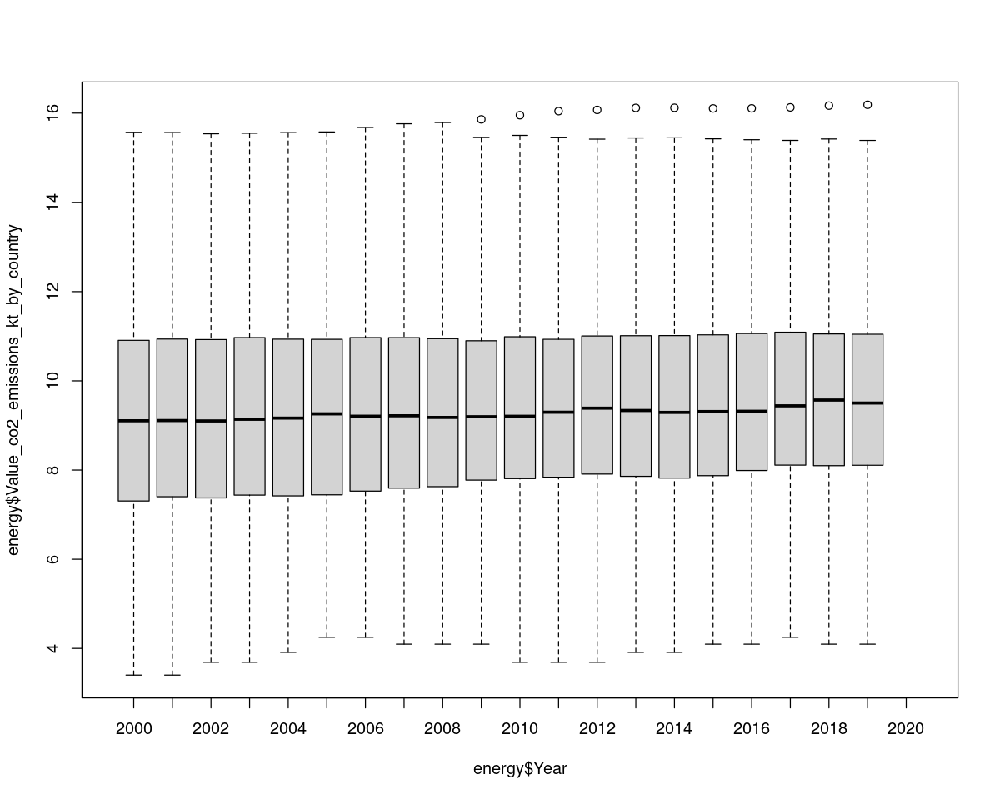

In [15]:
boxplot(energy$Value_co2_emissions_kt_by_country ~ energy$Year, data=energy)

**Ce boxplot nous permet de constater que la moyenne globale (c'est-à-dire de tous les pays du monde pris ensemble) de CO2 émise par an ne semble pas augmenter depuis 2000.**


**Les variables qualitatives étant nombreuses , on regroupe les pays par continents et les années par période quadriennale.**

In [16]:
library(forcats)
energy$Country <- as.factor(energy$Entity)
energy$Entity <- as.factor(energy$Entity)
energy$Entity <- fct_collapse(energy$Entity,
  "Europe" = c("Austria","Belgium","Belarus","Bosnia and Herzegovina","Bulgaria","Croatia","Cyprus","Czechia","Denmark","Estonia","Moldova","Finland","France","Germany","Greece","Hungary","Iceland","Serbia","Portugal","Ireland","Turkey","Italy","Latvia","Lithuania","Luxembourg","Malta","Netherlands","Norway","Poland","Portugal","Montenegro","Romania","Serbia","Slovakia","Slovenia","Spain","Sweden","Switzerland","United Kingdom","Ukraine"),
  "America" = c("Barbados","Guyana","Grenada","Dominica","Cuba","Costa Rica","Belize","Antigua and Barbuda","Ecuador","Argentina","Brazil","Canada","Chile","Colombia","Mexico","Haiti","Honduras","Jamaica","Paraguay","Venezuela","Peru","Uruguay","United States","Bolivia","Suriname","El Salvador","Panama","Nicaragua","Guatemala"),
  "Asia-Oceania" = c("Nauru","Maldives","Kiribati","Bhutan","Bahrain","China","Afghanistan","Armenia","Azerbaijan","Bangladesh","Cambodia","Australia","Dominican Republic","Egypt","Hong Kong","Pakistan","New Zealand","Taiwan","United Arab Emirates","Thailand","South Korea","Philippines","Saudi Arabia","Singapore","India","Indonesia","Iran","Israel","Japan","Malaysia","Fiji","Gabon","Georgia","Iraq","Jordan","Kazakhstan","Kuwait","Kyrgyzstan","Laos","Lebanon","Lesotho","Libya","Madagascar","Malawi","Mauritania","Mauritius","Mongolia","Mozambique","Myanmar","Namibia","Nepal","North Macedonia","Oman","Papua New Guinea","Qatar","Samoa","Seychelles","Sierra Leone","Solomon Islands","Sri Lanka","Syria","Tajikistan","Tanzania","Timor-Leste","Tonga","Trinidad and Tobago","Tunisia","Turkmenistan","Uzbekistan","Vanuatu","Vietnam","Yemen"),
  "Africa" = c("Algeria","Angola","Benin","Botswana","Burkina Faso","Burundi","Burundi","Cabo Verde","Cameroon","Central African Republic","Cameroon","Central African Republic","Nigeria","Equatorial Guinea","South Africa","Eritrea","Ethiopia","Chad","Comoros","Congo","Djibouti","Chad","Comoros","Congo","Democratic Republic of Congo","Djibouti","Egypt","Equatorial Guinea","Gambia","Guinea","Guinea-Bissau","Kenya","Ghana","Eritrea","Eswatini","Ethiopia","Liberia","Gabon","Gambia","Ghana","Mali","Guinea","Guinea-Bissau","Kenya","Lesotho","Morocco","Liberia","Libya","Madagascar","Niger","Malawi","Mali","Mauritania","Mauritius","Senegal","Morocco","Rwanda","Mozambique","Namibia","Somalia","Sudan","Niger","Nigeria","Togo","Rwanda","Sao Tome and Principe","Senegal","Seychelles","Uganda","Sierra Leone","Somalia","South Africa","South Sudan","Zambia","Zimbabwe","Sudan","Tanzania","Togo","Tunisia","Uganda","Zambia","Zimbabwe")
)
head(energy)
energy$Period <- fct_collapse(energy$Year, "2000-2004" = c("2000","2001","2002","2003","2004"), "2005-2009" = c("2005","2006","2007","2008","2009"),
                            "2010-2014" = c("2010","2011","2012","2013","2014"), "2015-2020" = c("2015","2016","2017","2018","2019","2020"))       
print(table(energy$Entity))
str(energy)

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude,Country
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
4,Asia-Oceania,2003,3.839076,3.082207,6.054750,0,0.7937254,8.186653,5.437941,1.40,7.106606,8.832278,5.250617,4.094345,13.38815,33.93911,67.70995,Afghanistan
5,Asia-Oceania,2004,4.479394,3.301515,6.651316,0,0.7483315,7.932298,5.319253,1.20,6.937314,1.414118,5.353667,4.094345,13.38815,33.93911,67.70995,Afghanistan
6,Asia-Oceania,2005,5.038938,3.492850,5.820653,0,0.7681146,7.964977,5.529703,1.41,7.346010,11.229715,5.489067,4.094345,13.38815,33.93911,67.70995,Afghanistan
7,Asia-Oceania,2006,5.542444,3.721559,5.647123,0,0.8000000,8.728716,5.718411,1.50,7.473069,5.357403,5.574940,4.094345,13.38815,33.93911,67.70995,Afghanistan
8,Asia-Oceania,2007,6.004249,3.911521,5.364699,0,0.8660254,8.885233,5.870087,1.53,7.478735,13.826320,5.885251,4.094345,13.38815,33.93911,67.70995,Afghanistan
9,Asia-Oceania,2008,6.511528,4.086563,4.601087,0,0.7348469,8.600733,6.409901,1.94,8.177516,3.924984,5.898975,4.094345,13.38815,33.93911,67.70995,Afghanistan



Asia-Oceania       Africa      America       Europe 
         846          856          520          646 
'data.frame':	2868 obs. of  19 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Year                                                            : Factor w/ 21 levels "2000","2001",..: 4 5 6 7 8 9 10 11 12 13 ...
 $ Access.to.electricity....of.population.                         : num  3.84 4.48 5.04 5.54 6 ...
 $ Access.to.clean.fuels.for.cooking                               : num  3.08 3.3 3.49 3.72 3.91 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.05 6.65 5.82 5.65 5.36 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.794 0.748 0.768 0.8 0.866 ...
 $ Low.carbon.electricity....electricity.                          : num  8.

# <span style="color:blue"> III. ACP

**Nous allons réaliser une Analyse en Composantes Principales (ACP) sur l'ensemble de données, à l'exception de la variable que nous cherchons à prédire. L'objectif de cette analyse est de simplifier la complexité de nos données en réduisant leurs dimensions.**

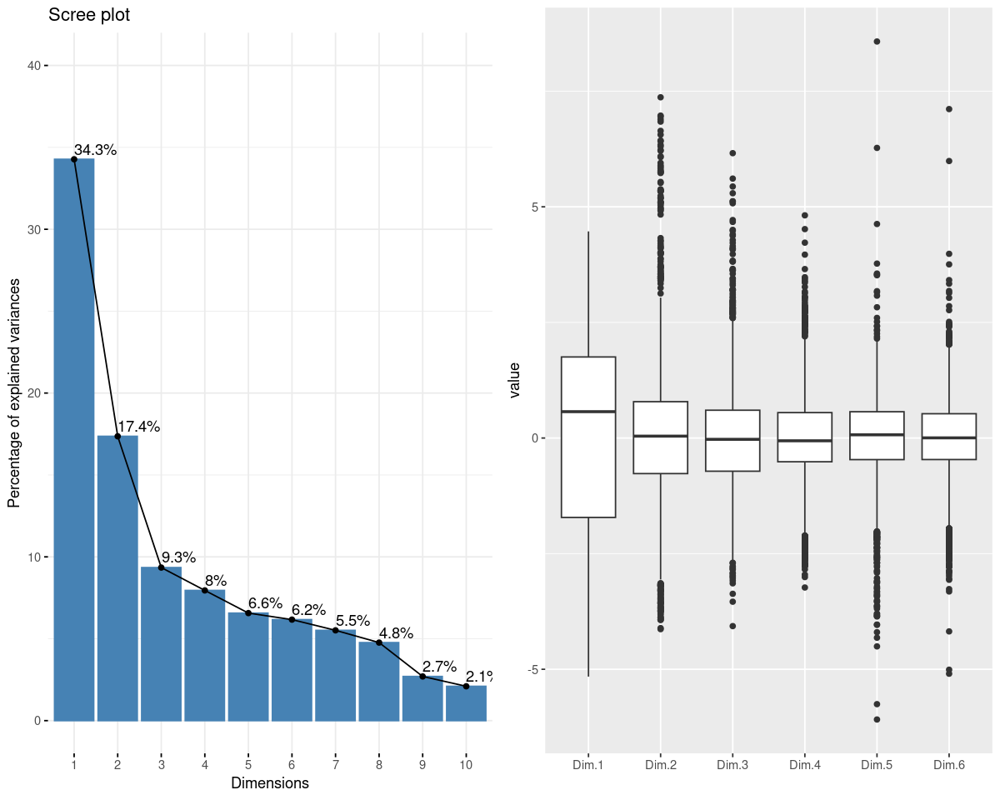

In [17]:
library(FactoMineR)
acp <- PCA(energy, scale.unit = TRUE,
           graph = FALSE, quali.sup = c(1,2,18,19), quanti.sup = 11, ncp = 6)

library(factoextra)
# graphe de la variance expliquée par dimension
g1<-fviz_eig(acp, addlabels = TRUE, ylim = c(0, 40))
library(reshape2)
g2<-ggplot(melt(acp$ind$coord),aes(x=Var2,y=value))+
  geom_boxplot()+
  xlab("")
grid.arrange(g1,g2,ncol=2)

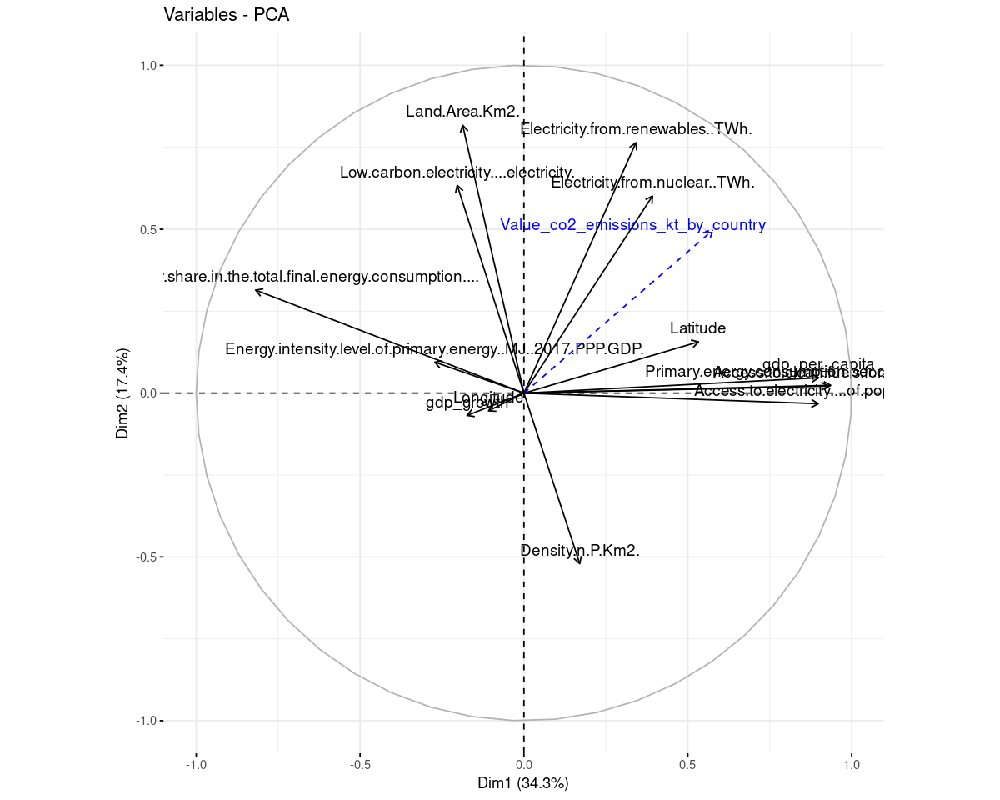

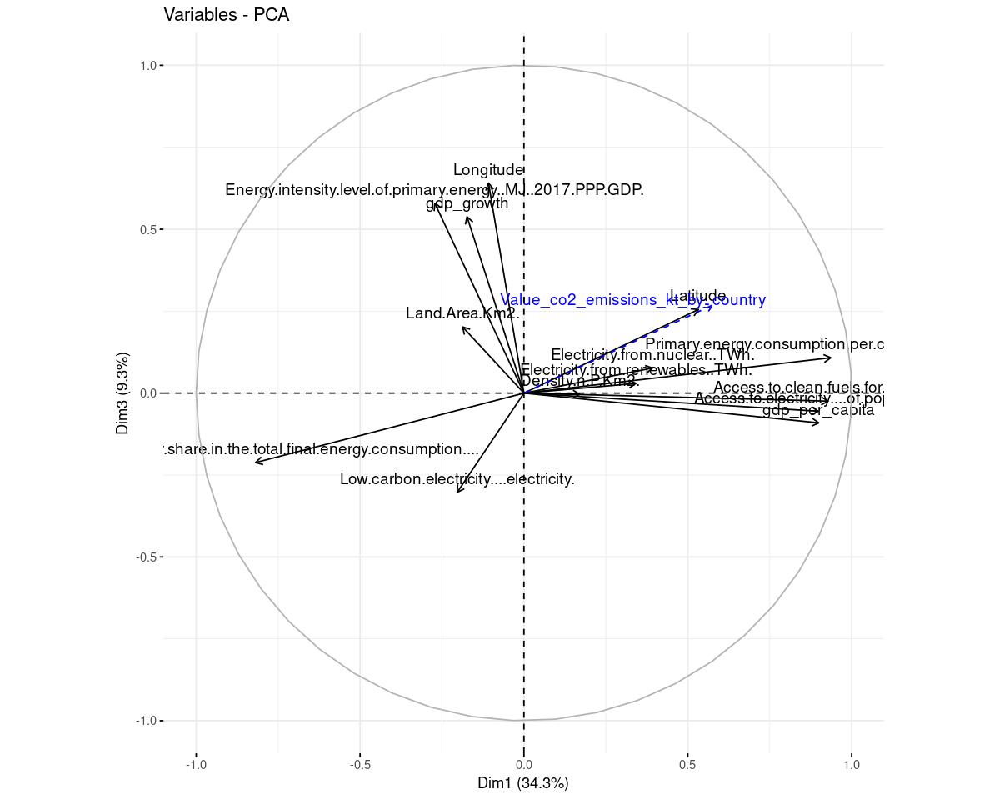

In [18]:
fviz_pca_var(acp)
fviz_pca_var(acp,axes=c(1,3))

**Grâce à ces graphes, on peut voir que la dimension 1 semble être correlée avec l'accès à l'électricité, l'accès à l'électricité pour cuisiner, la consommation par habitant et le PIB par habitant. En conclusion, elle semble être corrélée positivement avec les pays riches/développés. 
Pour la dimension 2, on voit qu'elle est corrélée positivement la taille du pays (Land Area), la part d'électricité renouvelables, d'électricité nucléaire et de d'électricité bas carbone.**

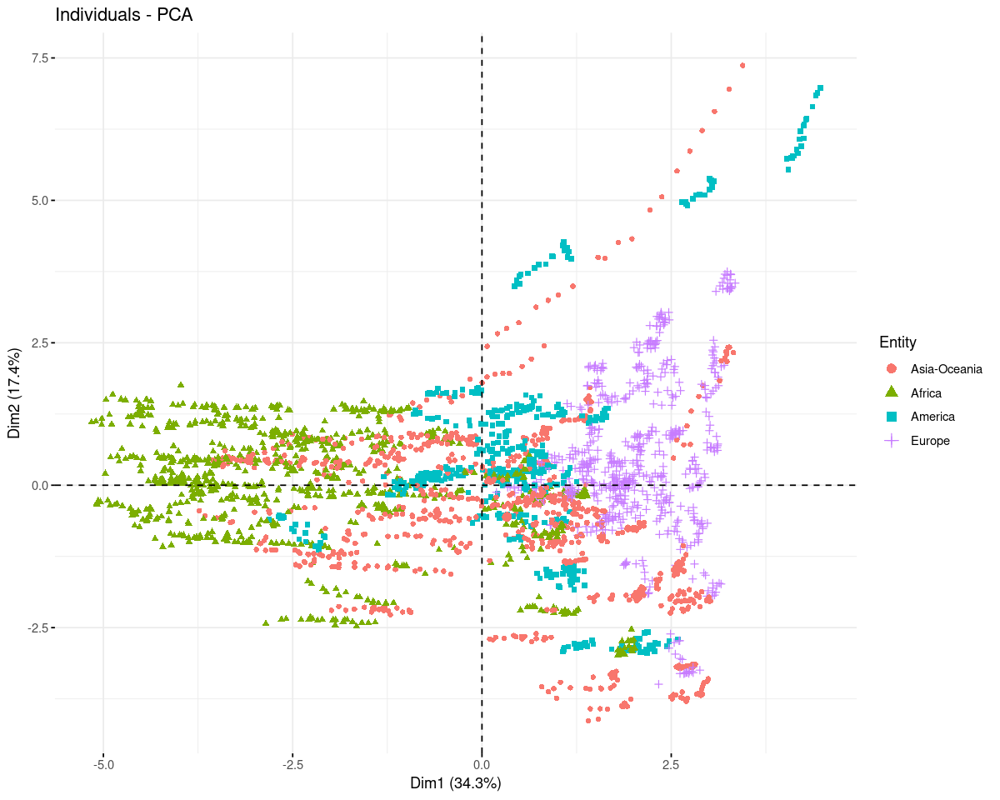

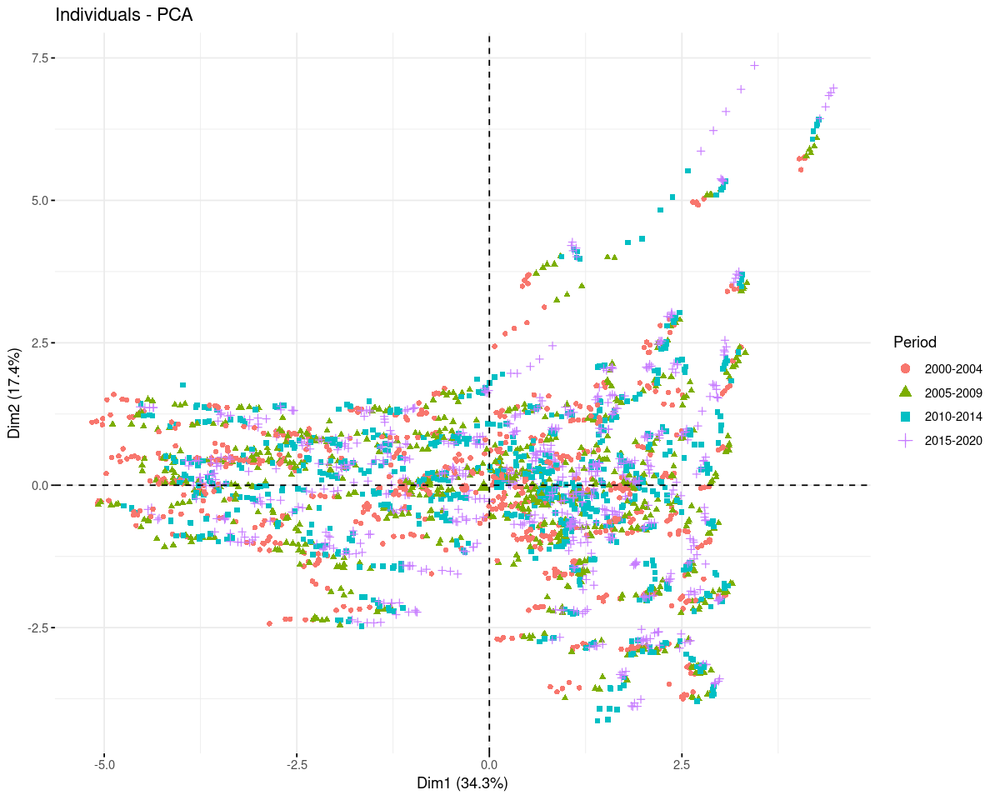

In [19]:
fviz_pca_ind(acp, label="none", habillage=1)
fviz_pca_ind(acp, label="none", habillage=19)

**On constate que les pays les plus pollueurs sont fortement corrélés avec la dimension 2, et également fortement corrélés négativement avec la dimension 1. Les émissions de CO2 sont ainsi négativement corrélées avec la dimension 1 et positivement avec la dimension 2.**

**Dans le graphique des individus, la plupart des pays européens se trouvent principalement du côté négatif de la dimension 1, tandis que les pays africains sont positivement corrélés. Quant aux pays asiatiques et américains, bien que des pays comme les États-Unis, la Chine et le Japon se positionnent aux extrémités négatives en raison de leurs fortes émissions de CO2, la plupart des autres pays de ces continents se situent du côté positif. Cette observation corrobore l'idée que la pollution est liée à la richesse, comme suggéré par la matrice de corrélation. Le PIB par habitant est d'ailleurs fortement corrélé négativement à la dimension 1. Ainsi il y'a un lien significatif entre la dimension 1 et la richess des pays.**

**Quant à la dimension 2, elle est négativement corrélée avec la taille du pays (Land Area), la quantité d'électricité renouvelable, nucléaire et bas carbone. Le graphique des individus révèle également une corrélation positive entre la quantité de CO2 émise et la dimension 2, suggérant ainsi que cette dimension pourrait être associée à l'accès à l'électricité.**

# <span style="color:blue"> IV. Modélisation

## <span style="color:blue"> IV.1 - Création du jeu de données test et apprentissage

In [20]:
set.seed(111) # initialisation du générateur

# Extraction des échantillons

test.ratio <- .2   # part de l'échantillon test
npop <- nrow(energy) # nombre de lignes dans les données
nvar <- ncol(energy) # nombre de colonnes

# taille de l'échantillon test
ntest <- ceiling(npop * test.ratio) 
# indices de l'échantillon test
testi <- sample(1:npop, ntest)
# indices de l'échantillon d'apprentissage
appri <- setdiff(1:npop, testi) 
### pour CO2 emissions
datappr <- energy[appri,] 
# construction de l'échantillon test
datestr <- energy[testi,] 
# vérification
str(datappr)
str(datestr)

'data.frame':	2294 obs. of  19 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Year                                                            : Factor w/ 21 levels "2000","2001",..: 4 5 6 8 9 10 11 12 14 15 ...
 $ Access.to.electricity....of.population.                         : num  3.84 4.48 5.04 6 6.51 ...
 $ Access.to.clean.fuels.for.cooking                               : num  3.08 3.3 3.49 3.91 4.09 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.05 6.65 5.82 5.36 4.6 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.794 0.748 0.768 0.866 0.735 ...
 $ Low.carbon.electricity....electricity.                          : num  8.19 7.93 7.96 8.89 8.6 ...
 $ Primary.energy.consumption.per.capita..kWh.person.              : num  5.44 

**Afin de pouvoir évaluer les performances de nos différentes méthodes de prédiction, on divise le jeu de données initial en un jeu de données apprentissage puis test. L'erreur de généralisation des méthodes sera alors évaluée sur le jeu de données test, afin d'éviter le phénomène d'overfittting ou surapprentissage. On crée également une fonction pour tracer le graphe des résidus.**

In [21]:
gplot.res <- function(x, y, titre = "titre"){
    ggplot(data.frame(x=x, y=y),aes(x,y))+
    geom_point(col = "blue")+xlim(0, 20)+ylim(-1.1, 1.1)+
    ylab("Résidus")+ xlab("Valeurs prédites")+
    ggtitle(titre)+
    geom_hline(yintercept = 0,col="green")
}

## <span style="color:blue"> IV. 2- Régression linéaire

**La régression linéaire va modéliser la relation entre l'émission de CO2 $ Y $ (la variable à prédire) et les autres variables du jeu de données $ X_1, X_2, ..., X_n $ (les variables explicatives). Elle cherche à établir une relation linéaire entre les variables en ajustant les coefficients $ \beta_0, \beta_1, \beta_2, ..., \beta_n $ de manière à minimiser la somme des carrés des écarts entre les valeurs prédites par le modèle et les valeurs réelles observées.**

**La formule de la régression linéaire est la suivante :**

**$Y = \beta_0 + \beta_1X_1 + \beta_2X_2 + ... + \beta_nX_n + \varepsilon$**

**Où :**
- **$ Y $ est la variable à prédire,**
- **$ X_1, X_2, ..., X_n $ les variables explicatives,**
- **$ \beta_0 $ est l'ordonnée à l'origine (le biais),**
- **$ \beta_1, \beta_2, ..., \beta_n $ sont les coefficients des variables explicatives,**
- **$ \varepsilon $ est l'erreur résiduelle qui représente la différence entre les valeurs prédites et les valeurs réelles.**


### IV. 2-A Sans sélection de variable


Call:
lm(formula = Value_co2_emissions_kt_by_country ~ . - Country - 
    Year, data = datappr)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.21463 -0.18113  0.03242  0.19716  1.76274 

Coefficients:
                                                                   Estimate
(Intercept)                                                      -1.371e+01
EntityAfrica                                                      8.687e-02
EntityAmerica                                                     6.818e-02
EntityEurope                                                      2.962e-01
Access.to.electricity....of.population.                           1.654e-01
Access.to.clean.fuels.for.cooking                                -6.355e-03
Renewable.energy.share.in.the.total.final.energy.consumption.... -8.166e-02
Electricity.from.nuclear..TWh.                                    1.499e-03
Electricity.from.renewables..TWh.                                 1.074e-03
Low.carbon.electricity..

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
Entity,3,2159.8980533,719.9660178,6688.094923,0.000000e+00
Access.to.electricity....of.population.,1,1321.7302223,1321.7302223,12278.158929,0.000000e+00
Access.to.clean.fuels.for.cooking,1,348.7275107,348.7275107,3239.489971,0.000000e+00
Renewable.energy.share.in.the.total.final.energy.consumption....,1,3.4982903,3.4982903,32.497225,1.348599e-08
Electricity.from.nuclear..TWh.,1,2094.6405575,2094.6405575,19458.077927,0.000000e+00
Electricity.from.renewables..TWh.,1,1728.4684990,1728.4684990,16056.537542,0.000000e+00
Low.carbon.electricity....electricity.,1,1.0659292,1.0659292,9.901906,1.672459e-03
Primary.energy.consumption.per.capita..kWh.person.,1,5.7960014,5.7960014,53.841718,3.009150e-13
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,1,51.5993259,51.5993259,479.329831,1.438439e-96


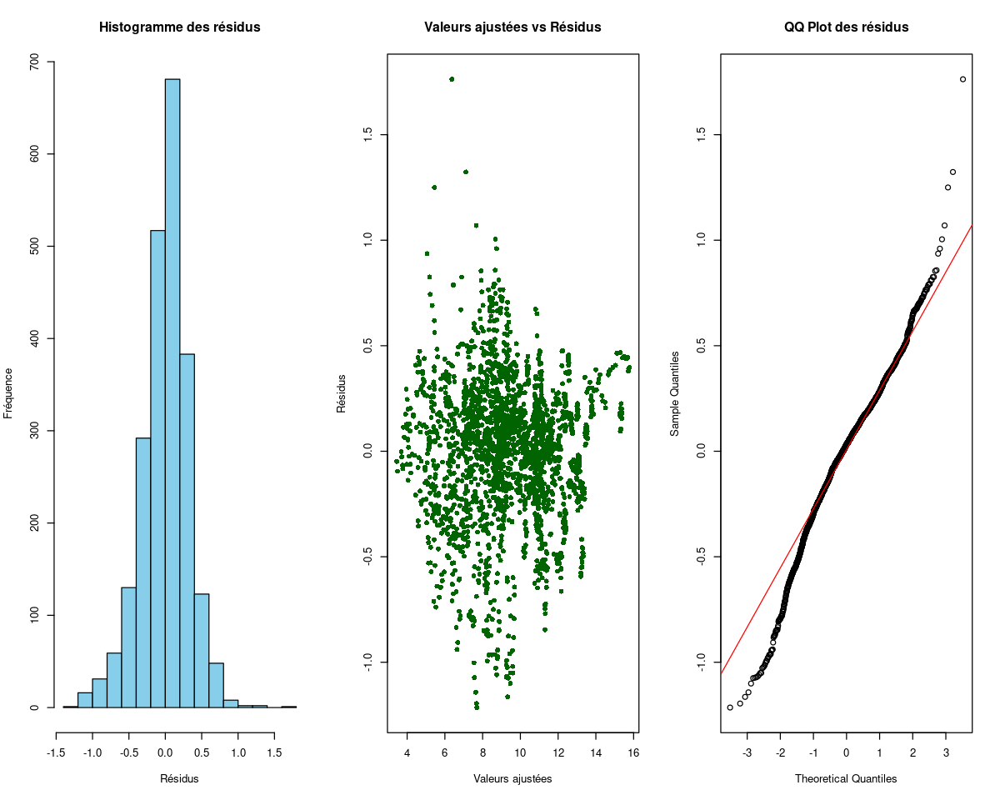

In [22]:

reg.lm <- lm(Value_co2_emissions_kt_by_country ~ . - Country - Year , data = datappr)


summary(reg.lm)


anova(reg.lm, test="F")


par(mfrow=c(1,3))  # Configuration de la disposition en 1 ligne et 3 colonnes pour les graphiques




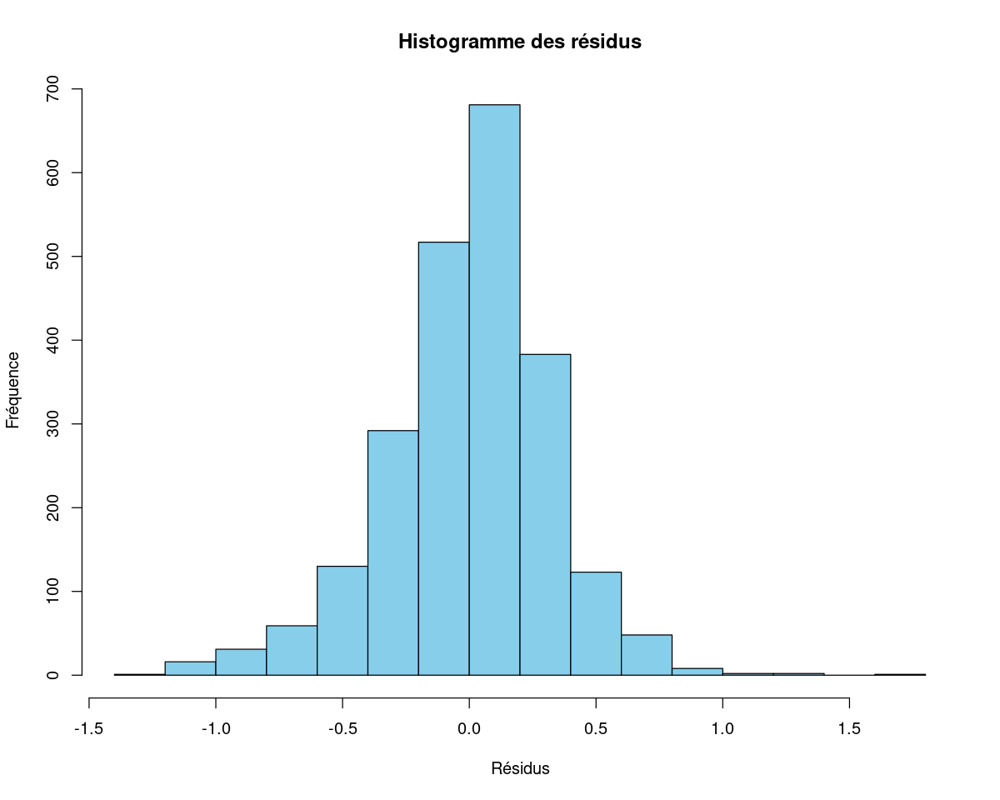

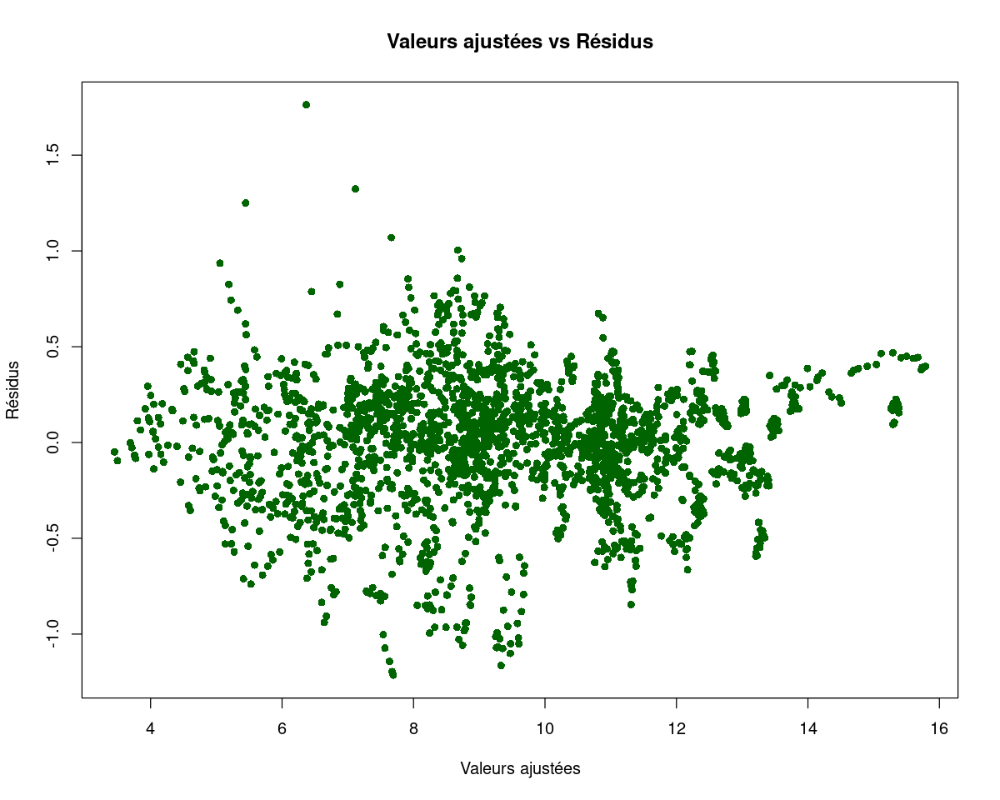

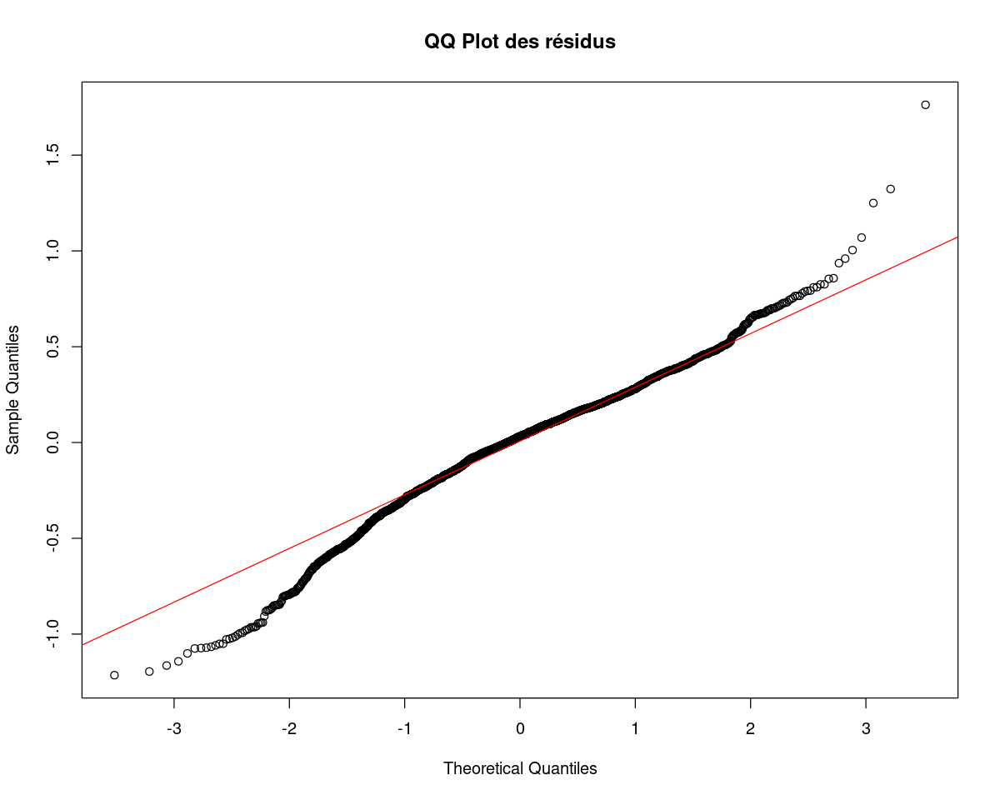

In [23]:

hist(residuals(reg.lm), main="Histogramme des résidus", xlab="Résidus", ylab="Fréquence", col="skyblue", border="black")


plot(fitted(reg.lm), residuals(reg.lm), main="Valeurs ajustées vs Résidus", xlab="Valeurs ajustées", ylab="Résidus", pch=16, col="darkgreen")


qqnorm(residuals(reg.lm), main="QQ Plot des résidus")
qqline(residuals(reg.lm), col="red")



**Le modèle de régression linéaire ajuste la variable à prédire en fonction de toutes les variables du problème.La valeur de référence (intercept) contient l'entité Asie et la période 2000-2004.Les coefficients pour l'Afrique et l'Amérique ne sont pas significatifs à 5%, contrairement à l'Europe.**

**Sur le qqplot des résidus on a un décrochage au niveau des extrêmes,indiquant des écarts par rapport à une distribution normale des résidus.**

**Le modèle de régression linéaire montre que plusieurs variables ont un impact significatif sur les émissions de CO2 par pays(Accès à l'électricité,Part des énergies renouvelables,Consommation d'énergie par habitant,Densité de population). Les résultats sont très significatifs, et le modèle explique une grande proportion de la variabilité des émissions de CO2. Certaines variables comme l'accès à l'électricité, la part des énergies renouvelables, la consommation d'énergie par habitant, et la densité de population jouent des rôles clés. La haute valeur du R² multiple et ajusté suggère un bon ajustement du modèle aux données.**

   

### IV.2-B Lasso

**La régression linéaire avec la méthode du Lasso est une variation de la régression linéaire qui introduit une pénalité L1 sur les coefficients $\beta$. Cette pénalité permet de réduire certains coefficients à zéro, ce qui peut conduire à une sélection automatique des variables explicatives et à une forme de régularisation du modèle.**

**La formule de la régression linéaire avec la méthode du Lasso est la suivante :**

$$Y = \beta_0 + \beta_1X_1 + \beta_2X_2 + ... + \beta_nX_n + \varepsilon$$

**avec la contrainte additionnelle que la somme des valeurs absolues des coefficients des variables explicatives, pondérée par un paramètre de pénalisation $\lambda$, soit inférieure à un seuil :**

$$\sum_{i=1}^{n} |\beta_i| \leq s$$

**où $s$ est le seuil déterminé par le paramètre de pénalisation $\lambda$.**

**La fonction objectif à minimiser pour trouver les coefficients $\beta$ avec la méthode du Lasso est la suivante :**

$$\text{min} \left( \sum_{i=1}^{m} (Y_i - (\beta_0 + \sum_{j=1}^{n} \beta_j X_{ij}))^2 + \lambda \sum_{j=1}^{n} |\beta_j| \right)$$

**où $\lambda$ contrôle la force de la pénalité L1. Plus $\lambda$ est grand, plus la pénalisation est forte et plus de coefficients seront réduits à zéro. En revanche, si $\lambda$ est proche de zéro, la méthode du Lasso se rapproche de la régression linéaire classique.**

**En résumé, la méthode du Lasso est utile pour sélectionner les variables importantes et pour régulariser le modèle, ce qui peut améliorer sa capacité de généralisation aux données non vues.**


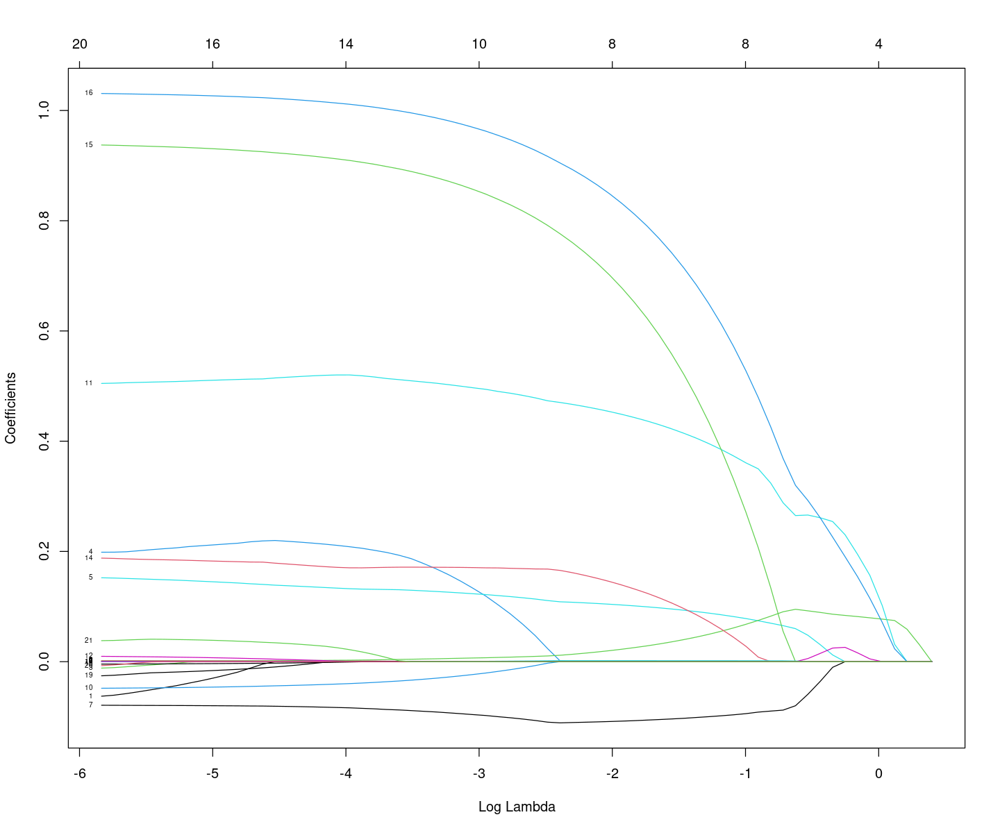

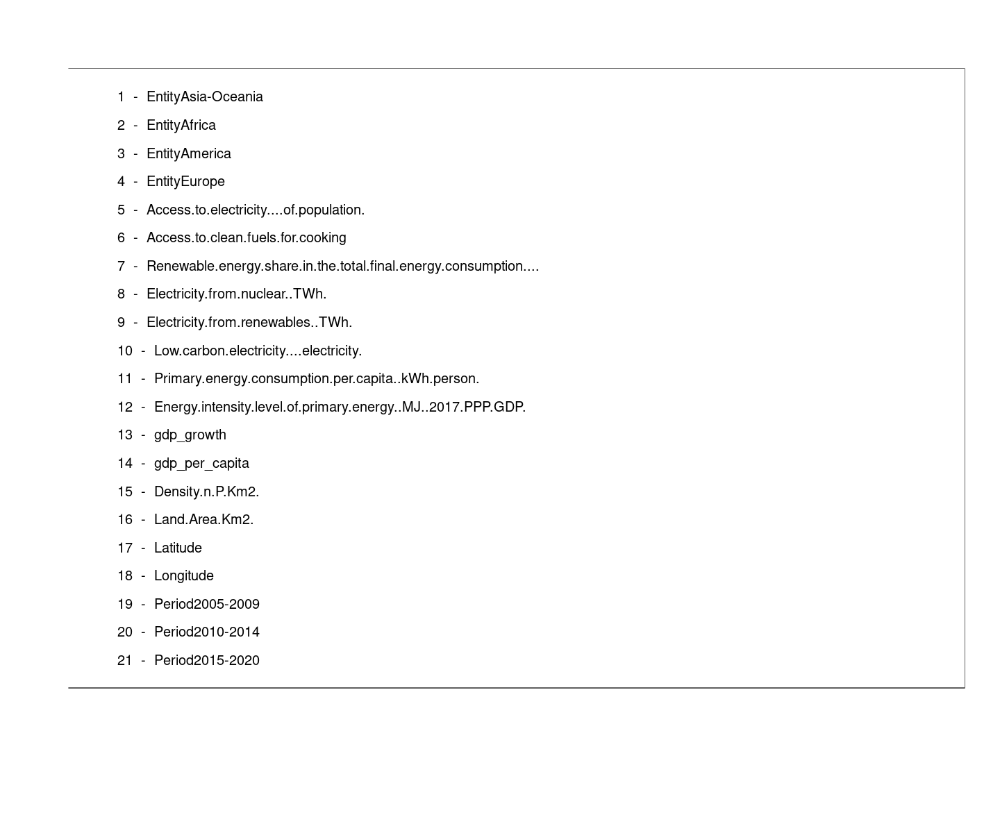

In [24]:
### Lasso
library(glmnet)
x.mat <- model.matrix(Value_co2_emissions_kt_by_country ~ . - 1 - Country - Year, data = datappr)
reg.lasso <- glmnet(y = datappr$Value_co2_emissions_kt_by_country, x = x.mat)
options(repr.plot.width = 12, repr.plot.height = 10)
plot(reg.lasso, xvar = "lambda", label = TRUE)

plot.new()
legend("topright", legend = paste(1:ncol(x.mat), " - ", colnames(x.mat)))

**Maintenant, nous allons déterminer le $\lambda_{optimal}$ en utilisant la Validation Croisée.**

**La méthode de la recherche en grille avec [validation croisée](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) $(\textit{Grid Search Cross Validation})$ est une technique d'optimisation utilisée pour trouver les meilleurs hyperparamètres pour un modèle d'apprentissage automatique. Cette méthode consiste à spécifier une grille de valeurs pour les hyperparamètres à optimiser, puis à évaluer le modèle pour chaque combinaison d'hyperparamètres à l'aide de la validation croisée.**

**La grille des hyperparamètres est généralement définie à l'avance avec une liste de valeurs pour chaque hyperparamètre à ajuster. Ensuite, la validation croisée est utilisée pour évaluer les performances du modèle pour chaque combinaison d'hyperparamètres sur plusieurs partitions des données d'entrée**

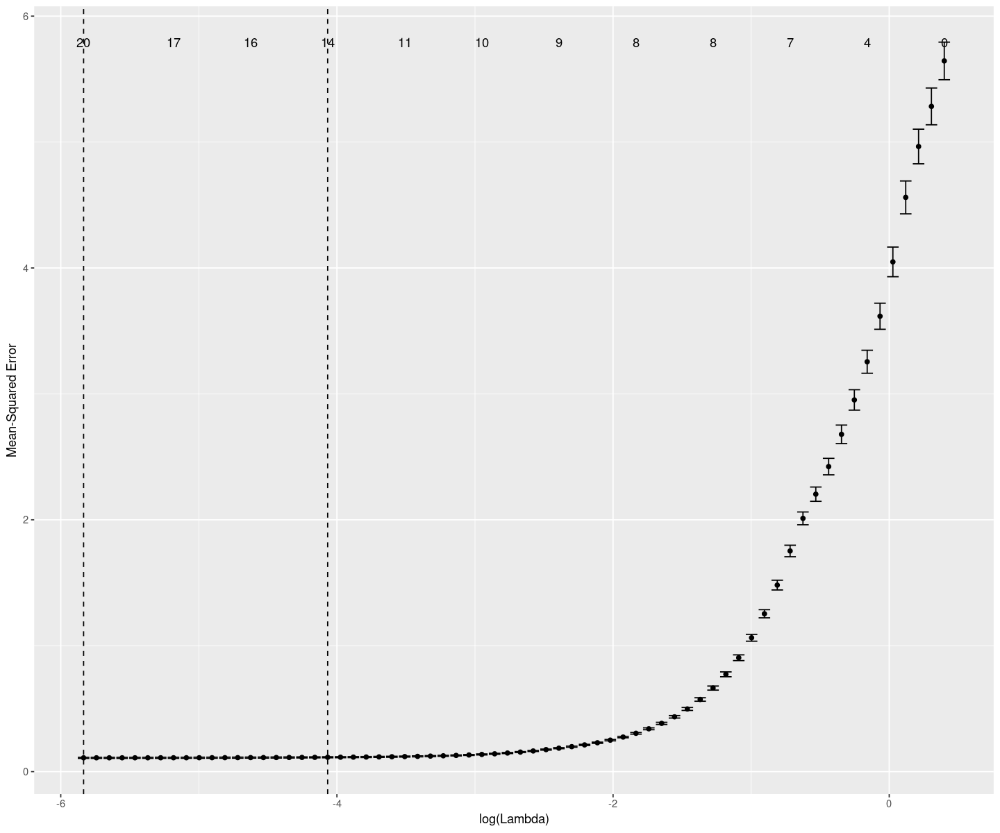

In [25]:
reg.lasso.cv <- cv.glmnet(y = datappr[, 11], x = x.mat)
autoplot(reg.lasso.cv)

**La première ligne verticale représente la valeur de **$\lambda_{\text{min}}$** et la seconde, la valeur de **$\lambda_{\text{1se}}$**.**

**$\lambda_{\text{min}}$** **est la valeur de $\lambda$ pour laquelle l'erreur moyenne de la validation croisée est la plus faible.** **$\lambda_{\text{1se}}$** **est la valeur de $\lambda$ qui pénalise davantage le modèle tout en maintenant l'erreur moyenne dans l'intervalle des erreurs associées à **$\lambda_{\text{min}}$**.**

**On affiche les courbes de pénalisation en commençant par **$\lambda_{\text{1se}}$**. Chaque courbe correspond à une variable. Elle monta variationeminrt à la norme $\ell_1$ de l'ensemble du vecteur des coefficients au fur et à mesure que $\lambda$ varie. L'axe supérieur indique le nombre de coefficients non nuls pour le $\lambda$ actuel, ce qui représente les degrés de liberté effectifs (df) pour le LASSO.**
**
 :**
 :**
) :


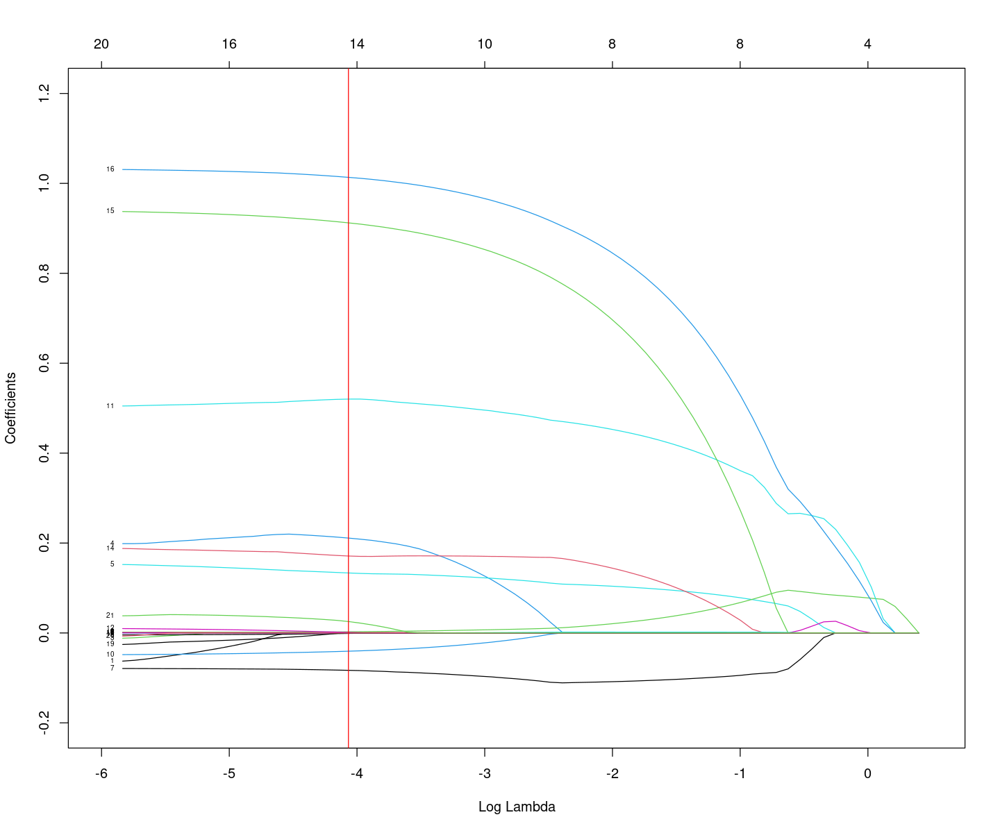

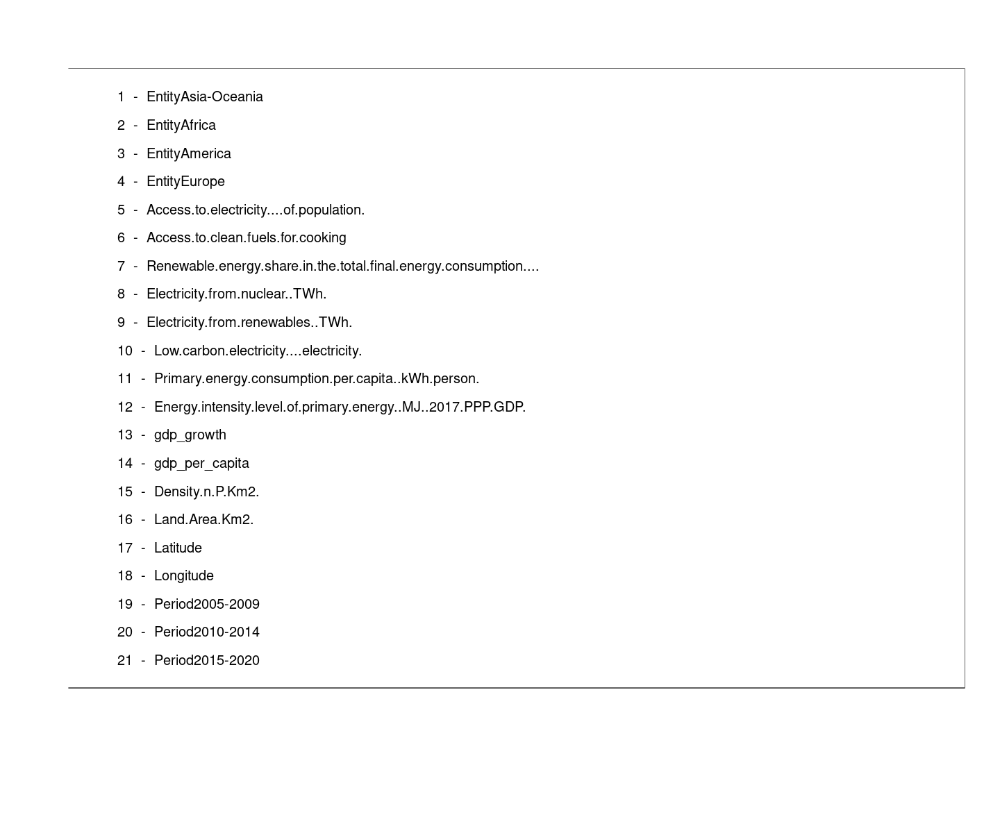

In [26]:
options(repr.plot.width = 12, repr.plot.height = 10)
plot(reg.lasso, xvar = "lambda", label = TRUE,xlim=c(-6,0.5),ylim=c(-0.2,1.2))
abline(v=log(reg.lasso.cv$lambda.1se),col="red")
plot.new()
legend("topright", legend = paste(1:ncol(x.mat), " - ", colnames(x.mat)))

**On représente le  graphe avec  le "$\lambda_{min} $" :**

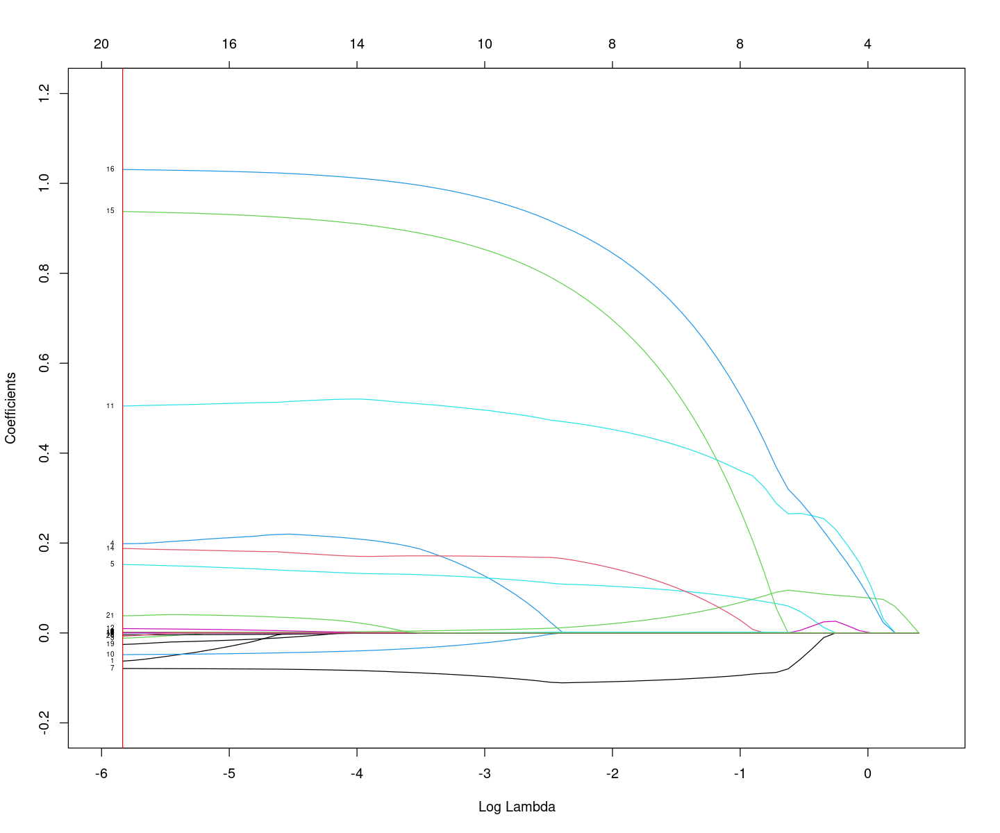

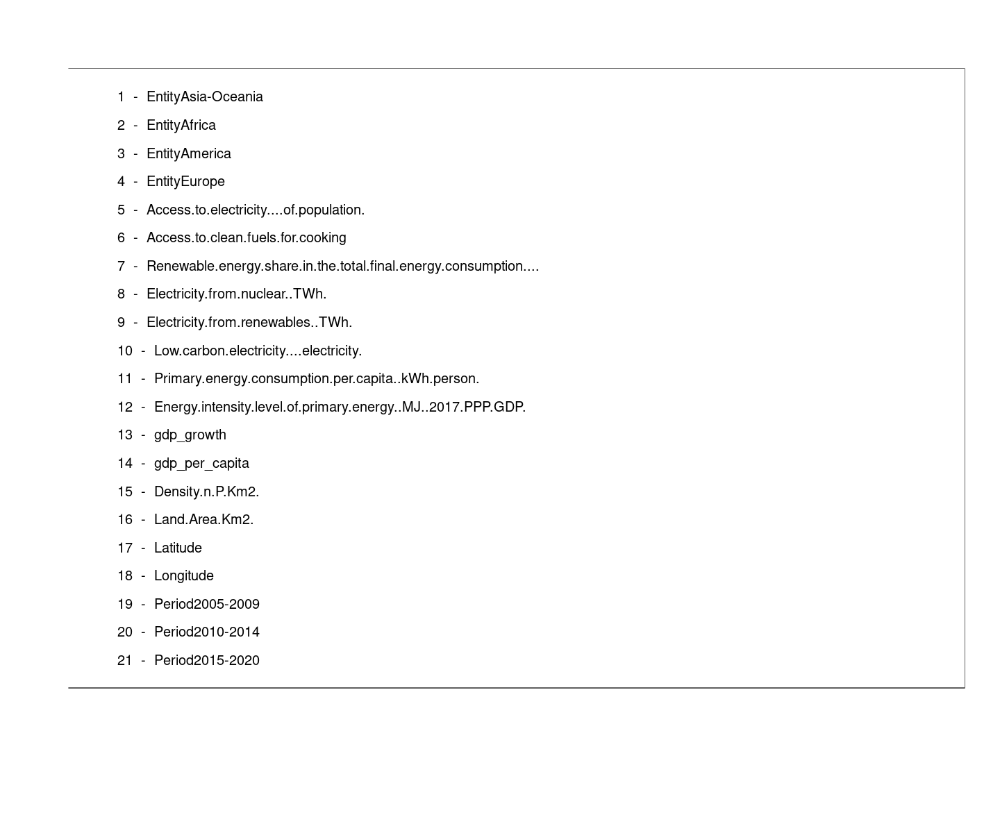

In [27]:
options(repr.plot.width = 12, repr.plot.height = 10)
plot(reg.lasso, xvar = "lambda", label = TRUE,xlim=c(-6,0.5),ylim=c(-0.2,1.2))
abline(v=log(reg.lasso.cv$lambda.min),col="red")
plot.new()
legend("topright", legend = paste(1:ncol(x.mat), " - ", colnames(x.mat)))

**On voit que lorsqu'on choisit un lambda très proche de 0 ("lambda min"), on ne réduit aucune variable à 0, contrairement au "lambda 1se" qui annule quelques variables.**
**Le paramètre lambda sélectionné est de 0. L'absence de régularisation ($\lambda = 0$) implique que la méthode Lasso ne pénalise pas les coefficients et fonctionne essentiellement comme une régression linéaire classique. Étant donné que la régression linéaire sans sélection de variables est déjà assez précise sur ces données, le Lasso ne sélectionne aucune variable supplémentaire. Ainsi, le modèle Lasso réduit simplement à une régression linéaire ordinaire dans ce cas.**


### <span style="color:blue"> IV.2-C AIC

**On utilise désormais une autre méthode de sélection de variables, à savoir le critère AIC, défini comme tel :
AIC = -2ln(L) + 2k. Il est calculé en prenant en compte, la vraisemblance L, qualité d'ajustement du modèle ainsi que sa complexité k représentant le nombre de paramètres.Le but étant de trouver un compromis entre les deux.On cherche donc le modèle qui minimise ce critère.**

In [45]:
# Exécuter la sélection de modèle par la méthode backward avec le critère AIC
reg.glm.step <- step(reg.lm, direction = "backward")

# Obtenir les noms des variables supprimées
removed_vars <- setdiff(names(reg.lm$model), names(reg.glm.step$model))

# Afficher les variables supprimées
print(removed_vars)


Start:  AIC=-5092.15
Value_co2_emissions_kt_by_country ~ (Entity + Year + Access.to.electricity....of.population. + 
    Access.to.clean.fuels.for.cooking + Renewable.energy.share.in.the.total.final.energy.consumption.... + 
    Electricity.from.nuclear..TWh. + Electricity.from.renewables..TWh. + 
    Low.carbon.electricity....electricity. + Primary.energy.consumption.per.capita..kWh.person. + 
    Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. + 
    gdp_growth + gdp_per_capita + Density.n.P.Km2. + Land.Area.Km2. + 
    Latitude + Longitude + Country + Period) - Country - Year

                                                                   Df Sum of Sq
- Electricity.from.renewables..TWh.                                 1       0.0
- Electricity.from.nuclear..TWh.                                    1       0.0
- Access.to.clean.fuels.for.cooking                                 1       0.1
<none>                                                                         
-

[1] "Year"                              "Access.to.clean.fuels.for.cooking"
[3] "Electricity.from.nuclear..TWh."    "Electricity.from.renewables..TWh."
[5] "Country"                          


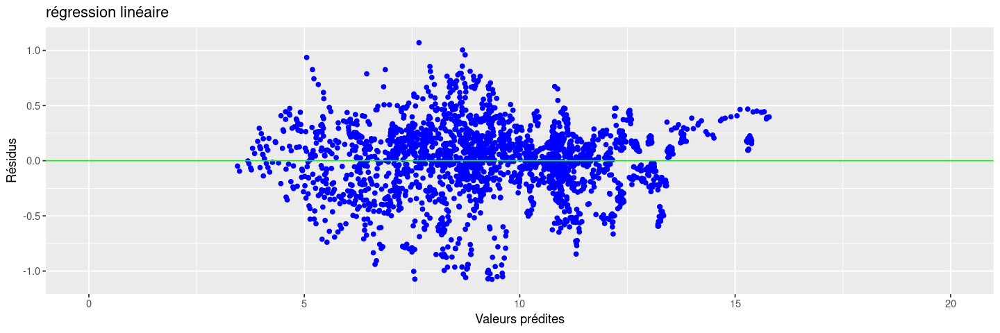

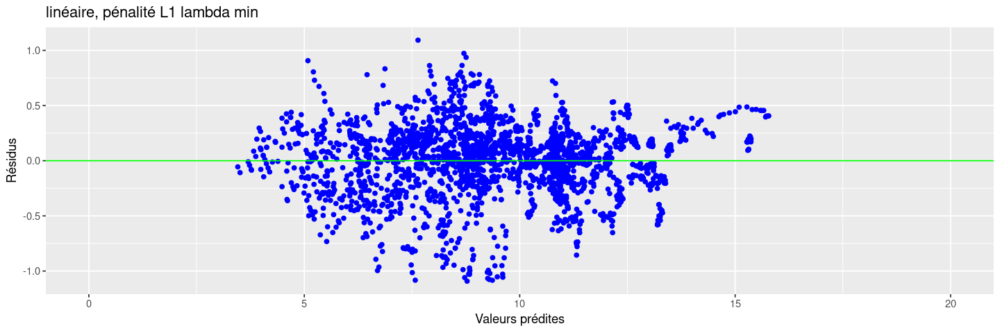

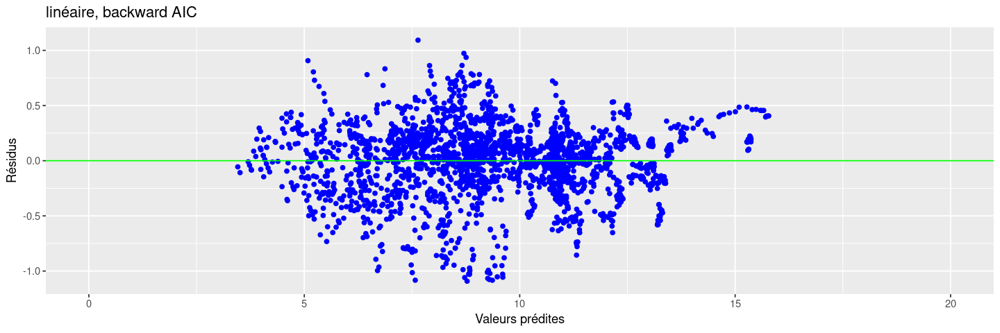

In [29]:
### linéaire pas de sélection
res.lm <- reg.lm$residuals
fit.lm <- reg.lm$fitted.values
### Lasso lambda min
fit.lasso <- predict(reg.lasso.cv, s = "lambda.min", newx = x.mat)
res.lasso <- datappr$Value_co2_emissions_kt_by_country - fit.lasso
### AIC
fit.glm <- reg.glm.step$fitted.values
res.glm <- reg.glm.step$residuals

# Graphe des résidus
options(repr.plot.width = 12, repr.plot.height = 4)
g1<-gplot.res(fit.lm, res.lm, "régression linéaire")
g2<-gplot.res(fit.lasso, res.lasso, "linéaire, pénalité L1 lambda min")
g3<-gplot.res(fit.lasso, res.lasso, "linéaire, backward AIC")
g1
g2
g3

In [30]:
# Calcul des prévisions pour le modèle linéaire complet
pred.glm <- predict(reg.lm, newdata = datestr)
# Erreur quadratique moyenne de prévision (MSE)
sum((pred.glm - datestr[, "Value_co2_emissions_kt_by_country"])^2) / nrow(datestr)

[1] 0.1114567

In [31]:
# Calcul des prévisions pour le modèle linéaire pénalisation Lasso
x.test <- model.matrix(Value_co2_emissions_kt_by_country ~ . - 1 - Country - Year, data = datestr)
reg.lasso.cv.test <- cv.glmnet(y = datestr[, 11], x = x.test)
fit.lasso <- predict(reg.lasso.cv.test, s = "lambda.min", newx = x.test)
# Erreur quadratique moyenne de prévision (MSE)
sum((fit.lasso - datestr[, "Value_co2_emissions_kt_by_country"])^2) / nrow(datestr)

[1] 0.1089307

In [32]:
# Calcul des prévisions pour le modèle linéaire backward AIC
pred.glm <- predict(reg.glm.step, newdata = datestr)
# Erreur quadratique moyenne de prévision (MSE)
sum((pred.glm - datestr[, "Value_co2_emissions_kt_by_country"])^2) / nrow(datestr)

[1] 0.1114325

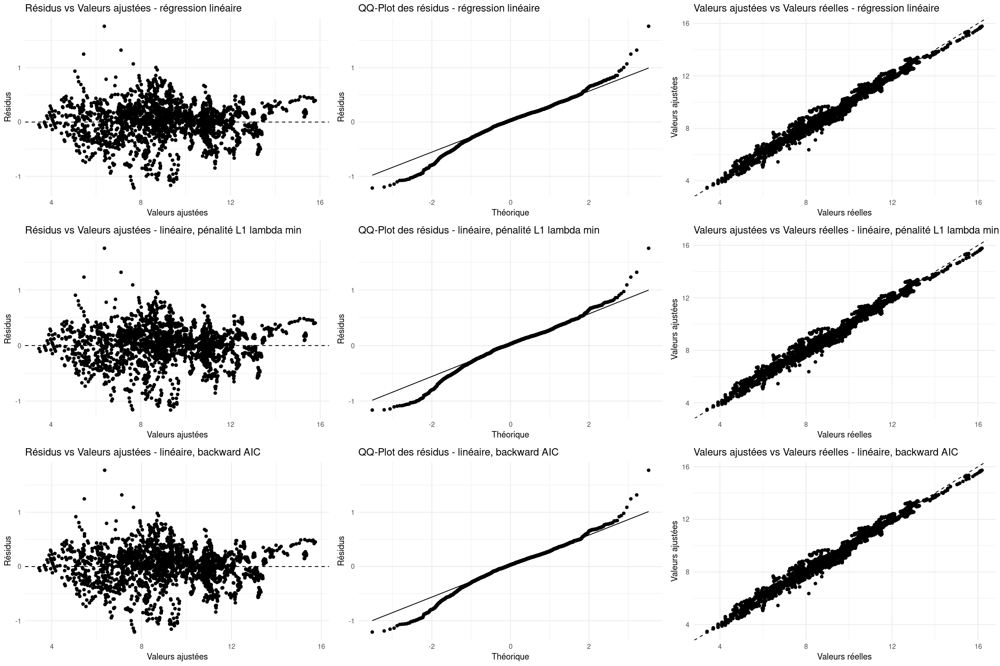

In [33]:
library(ggplot2)
library(gridExtra)

# Fonction pour créer le graphe des résidus et le QQ-plot
gplot_res <- function(fitted, residuals, title) {
  p1 <- ggplot() +
    geom_point(aes(x = fitted, y = residuals)) +
    geom_hline(yintercept = 0, linetype = "dashed") +
    labs(title = paste("Résidus vs Valeurs ajustées -", title), x = "Valeurs ajustées", y = "Résidus") +
    theme_minimal()
  
  p2 <- ggplot() +
    geom_qq(aes(sample = residuals)) +
    geom_qq_line(aes(sample = residuals)) +
    labs(title = paste("QQ-Plot des résidus -", title), x = "Théorique", y = "Résidus") +
    theme_minimal()
  
  p3 <- ggplot() +
    geom_point(aes(x = datappr$Value_co2_emissions_kt_by_country, y = fitted)) +
    geom_abline(intercept = 0, slope = 1, linetype = "dashed") +
    labs(title = paste("Valeurs ajustées vs Valeurs réelles -", title), x = "Valeurs réelles", y = "Valeurs ajustées") +
    theme_minimal()
  
  list(p1, p2, p3)
}

# Régression linéaire
res.lm <- reg.lm$residuals
fit.lm <- reg.lm$fitted.values
plots.lm <- gplot_res(fit.lm, res.lm, "régression linéaire")

# Lasso lambda min
fit.lasso <- predict(reg.lasso.cv, s = "lambda.min", newx = x.mat)
res.lasso <- datappr$Value_co2_emissions_kt_by_country - fit.lasso
plots.lasso <- gplot_res(fit.lasso, res.lasso, "linéaire, pénalité L1 lambda min")

# AIC
fit.glm <- reg.glm.step$fitted.values
res.glm <- reg.glm.step$residuals
plots.glm <- gplot_res(fit.glm, res.glm, "linéaire, backward AIC")

# Affichage des graphiques
options(repr.plot.width = 18, repr.plot.height = 12)
grid.arrange(grobs = c(plots.lm, plots.lasso, plots.glm), ncol = 3)


**Les trois méthodes de régression que nous avons appliquées ne semblent pas apporter de différences significatives. En effet, la méthode du Lasso, même avec le lambda optimal, n'élimine aucune variable. En revanche, la méthode de sélection basée sur le critère AIC supprime cinq variables, celles qui étaient statistiquement les moins significatives pour la régression linéaire.**

**En termes de performance, la régression linéaire présente un Mean Squared Error (MSE) plus faible. Cependant, les graphiques générés par les différentes méthodes sont assez similaires.**

In [132]:
paste("CV estimate of lambda :", round(reg.lasso.cv$lambda.min, 3))
coef(reg.lasso.cv, s = "lambda.min")

[1] "CV estimate of lambda : 0.004"

22 x 1 sparse Matrix of class "dgCMatrix"
                                                                            s1
(Intercept)                                                      -1.349136e+01
EntityAsia-Oceania                                               -9.520670e-02
EntityAfrica                                                      .           
EntityAmerica                                                     7.112405e-03
EntityEurope                                                      1.098270e-01
Access.to.electricity....of.population.                           1.529636e-01
Access.to.clean.fuels.for.cooking                                 .           
Renewable.energy.share.in.the.total.final.energy.consumption.... -7.640564e-02
Electricity.from.nuclear..TWh.                                    5.842116e-04
Electricity.from.renewables..TWh.                                 .           
Low.carbon.electricity....electricity.                           -4.490559e-02
Primary.en

## <span style="color:blue"> IV.3 - SVM

**Le but de la SVM est de séparer les données en classes à l'aide d'une frontière aussi simple que possible de façon à ce que la distance entre les classes et la frontière (distance qu'on appelle la marge) soit la plus grande possible. Pour cela, on a souvent besoin de projeter nos données dans un espace vectoriel de plus grande dimension (car les données ne sont pas forcément linéairement séparables). On le fait en utilisant des noyaux.** **Dans notre cas des noyaux linéaires, des noyaux radials et polynomials.**

In [48]:
install.packages("e1071")
library(e1071)

Installation du package dans ‘/home/tsall/R/libs’
(car ‘lib’ n'est pas spécifié)

installation de la dépendance ‘proxy’




### <span style="color:blue"> IV.3-A Noyau linéaire

**On commence par optimiser les paramètres le noyau linéaire $\langle x,x'\rangle$. Pour chacun des noyaux, nous devons au moins optimiser deux hyperparamètres : le coût C et epsilon.
Concernant l'hyperparamètre epsilon, il représente la taille de la marge. Plus epsilon est petit, plus la largeur de la marge est petite.
Par ailleurs, on travaille en classification soft margin, c'est à dire qu'on autorise des points à être dans la marge à l'inverse du hard margin. Dans notre cas, C est un hyperparamètre jouant sur le nombre de points pouvant se situer dans les marges, donc potentiellement mal classés. Plus C augmente, plus on restreint le nombre de points dans les marges, et donc on risque le surapprentissage.
Quant au epsilon, il représente la taille de la marge. Plus epsilon est petit, plus la largeur de la marge est petite.**

**Pour optimiser les paramètres, la fonction .tune a recours a la validation croisée, afin d'éviter le phénomène de surajustement. En effet, l'erreur est à chaque boucle calculée sur un jeu de données test, un paquet issu du jeu de données d'apprentissage.**

In [49]:
svm.reg.lin.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "lin", cost = c(1, 2, 3, 4), epsilon = c(0.001, 0.01, 0.1, 1))
summary(svm.reg.lin.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 cost epsilon
    4     0.1

- best performance: 0.1164178 

- Detailed performance results:
   cost epsilon     error dispersion
1     1   0.001 0.1194780 0.02408811
2     2   0.001 0.1194338 0.02402536
3     3   0.001 0.1194457 0.02407603
4     4   0.001 0.1194687 0.02406260
5     1   0.010 0.1194603 0.02422272
6     2   0.010 0.1195080 0.02422085
7     3   0.010 0.1194988 0.02417008
8     4   0.010 0.1195110 0.02417483
9     1   0.100 0.1164221 0.02029223
10    2   0.100 0.1164418 0.02032901
11    3   0.100 0.1164270 0.02031798
12    4   0.100 0.1164178 0.02029766
13    1   1.000 1.2418335 0.12933258
14    2   1.000 1.2418335 0.12933258
15    3   1.000 1.2418335 0.12933258
16    4   1.000 1.2418335 0.12933258


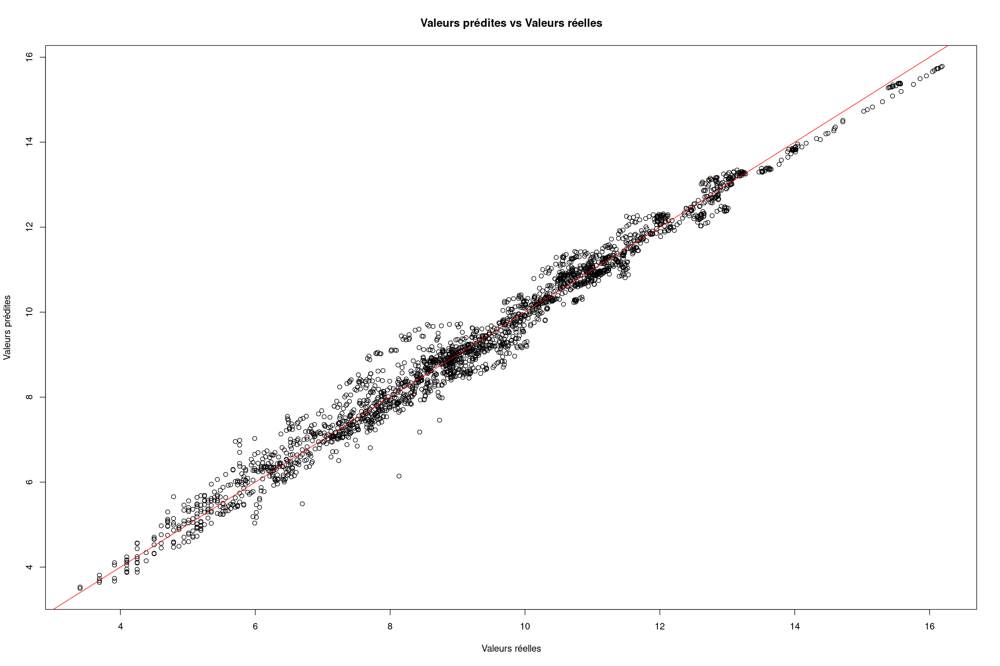

In [50]:
fit.svmr=svm.reg.lin.tune$best.model$fitted


plot(datappr[,"Value_co2_emissions_kt_by_country"], fit.svmr, 
     xlab = "Valeurs réelles", ylab = "Valeurs prédites",
     main = "Valeurs prédites vs Valeurs réelles")


abline(0, 1, col = "red")

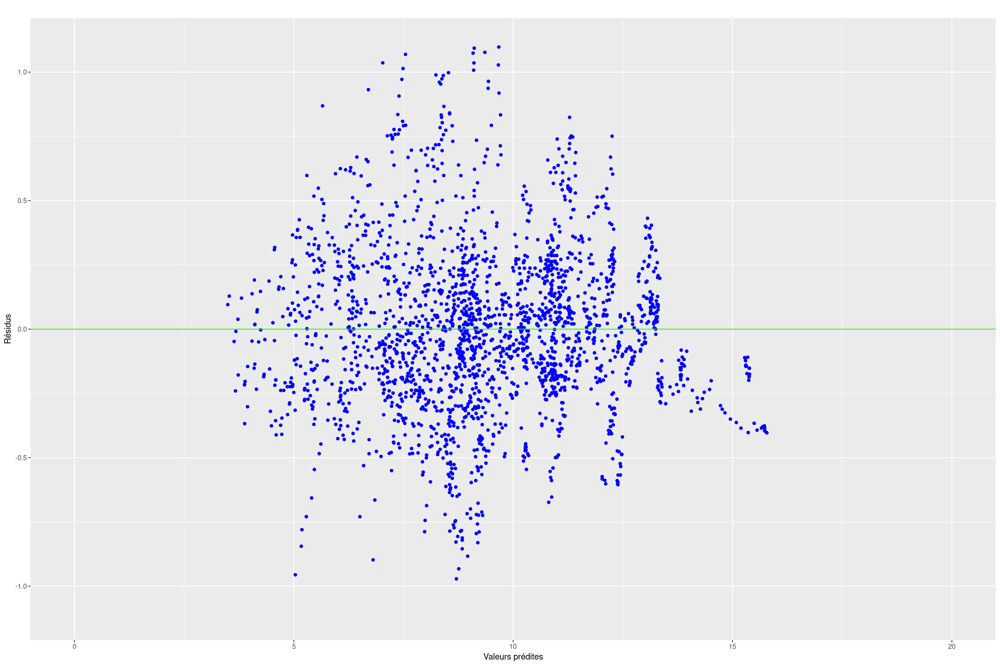

In [51]:

res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

**Les résidus de notre modèle linéaire tuné sont symétriques et avec d'assez petites valeurs.**

### <span style="color:blue"> IV.3-B Noyau polynomial

**Le noyau polynomial est défini comme : $(\gamma \langle x,x' \rangle+r)^d$. Ici en plus du coût C et epsilon, il faut optimiser les paramètres degré d du polynôme, le coef0 noté r et le gamma.**

<font color='red'>Le tuning complet de tous les paramètres nécessite énormément de temps. On met en commentaire la partie qui fait le tunage et on éxècute directement avec les résultats obtenus</font>

In [52]:
#svm.reg.poly.tune2 <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "poly", cost = c(1, 2, 3, 4, 5), epsilon = c(0.001, 0.01, 0.1, 1), coef0 = 5, gamma = 0.06, degree = 3)
#summary(svm.reg.poly.tune2)

In [53]:
svm.reg.poly.tune2 <-svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "poly", cost = 5, epsilon = 0.01, coef0 = 5, gamma = 0.06, degree = 3)

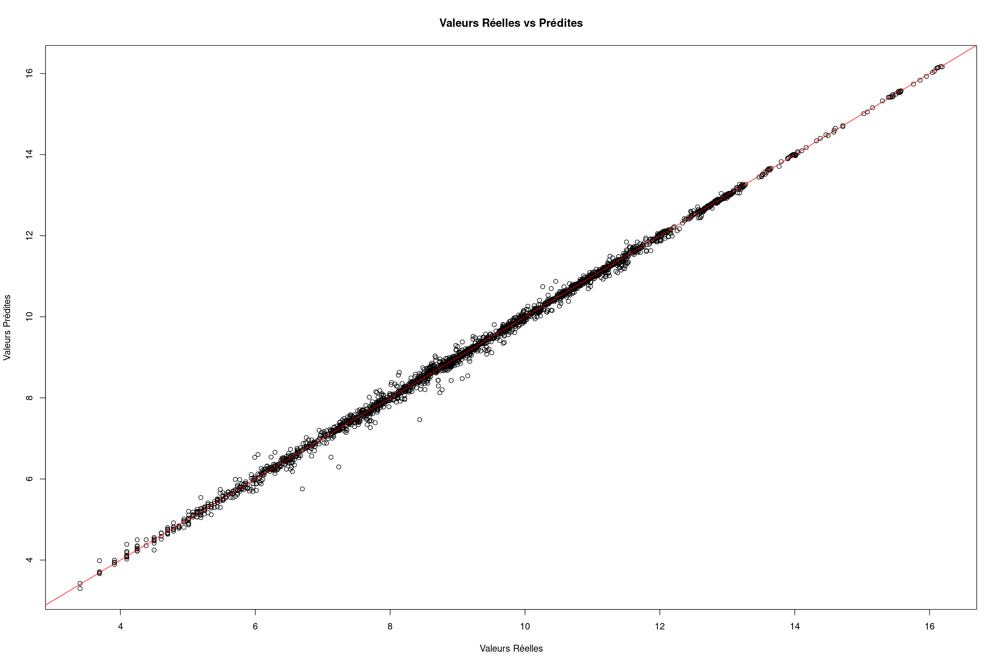

In [55]:
predictions <- predict(svm.reg.poly.tune2, datappr)
plot(datappr$Value_co2_emissions_kt_by_country, predictions,
     xlab = "Valeurs Réelles",
     ylab = "Valeurs Prédites",
     main = "Valeurs Réelles vs Prédites")
abline(0, 1, col = "red")  # Ajoute une ligne de référence pour une performance parfaite


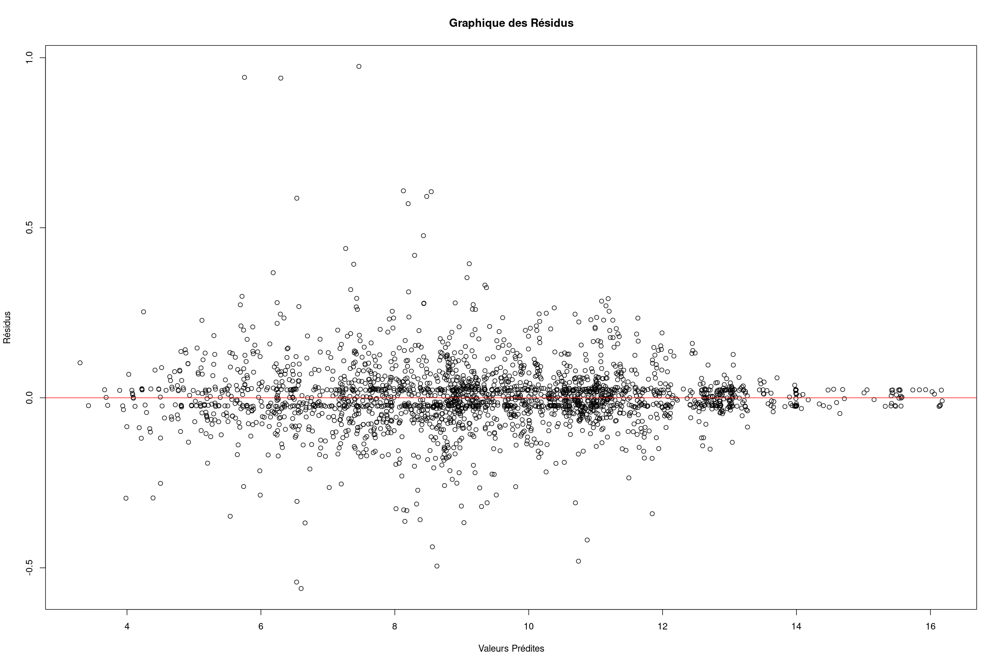

In [56]:
residus <- datappr$Value_co2_emissions_kt_by_country - predictions
plot(predictions, residus,
     xlab = "Valeurs Prédites",
     ylab = "Résidus",
     main = "Graphique des Résidus")
abline(h = 0, col = "red")  # Ajoute une ligne horizontale à y = 0 pour référence


**Ici on peut observer un effet couloir sur nos résidus : il vient du paramètre epsilon. De plus, le fait d'avoir plus ou moins un grand nombre de points à l'extérieur des marges provient de la faible valeur du coût C = 5, ainsi on autorise des points à être potentiellement mal classés et donc la valeur des résidus augmente pour ces mêmes points.Ceci peut-être cependant nécessaire pour éviter le surajustement.**

### <span style="color:blue"> IV.3-C Noyau radial

**Enfin, pour le noyau radial, $exp(-\gamma\lVert x-x' \rVert^2)$, il faut optimiser les paramètres gamma, epsilon et le coût C.**

In [62]:
#svm.reg.rad.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "radial", gamma = 0.02, cost = c(1, 10, 50, 100), epsilon = c(0.001,0.01,0.1,1))
#summary(svm.reg.rad.tune)

In [63]:
svm.reg.rad.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "radial", gamma = 0.02, cost = c(1, 10, 50, 100), epsilon = c(0.001,0.01,0.1,1))
summary(svm.reg.rad.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 gamma cost epsilon
  0.02  100   0.001

- best performance: 0.02072298 

- Detailed performance results:
   gamma cost epsilon      error  dispersion
1   0.02    1   0.001 0.04997311 0.014575447
2   0.02   10   0.001 0.03014321 0.009284622
3   0.02   50   0.001 0.02233497 0.007575418
4   0.02  100   0.001 0.02072298 0.008118795
5   0.02    1   0.010 0.04975371 0.014548709
6   0.02   10   0.010 0.02983450 0.009070124
7   0.02   50   0.010 0.02186148 0.007501684
8   0.02  100   0.010 0.02134411 0.011544520
9   0.02    1   0.100 0.06025997 0.017148792
10  0.02   10   0.100 0.03915532 0.010363851
11  0.02   50   0.100 0.03629867 0.009564106
12  0.02  100   0.100 0.03538034 0.009412586
13  0.02    1   1.000 1.39150973 0.081004499
14  0.02   10   1.000 1.37669274 0.074049971
15  0.02   50   1.000 1.37669274 0.074049971
16  0.02  100   1.000 1.37669274 0.074049971


In [71]:
svm.reg.rad.tune <-svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "radial", gamma = 0.02, cost = 100, epsilon =0.001)

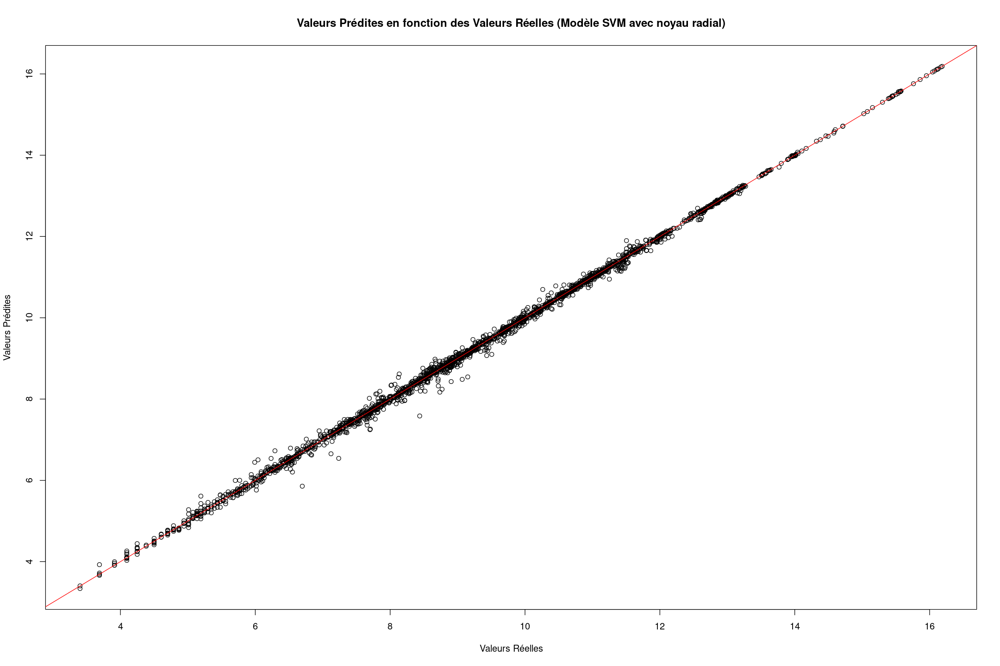

In [75]:
predictions_radial <- predict(svm.reg.rad.tune, datappr)

plot(datappr$Value_co2_emissions_kt_by_country, predictions_radial,
     xlab = "Valeurs Réelles",
     ylab = "Valeurs Prédites",
     main = "Valeurs Prédites en fonction des Valeurs Réelles (Modèle SVM avec noyau radial)")

abline(0, 1, col = "red")  # Ajoute une ligne de référence pour une performance parfaite


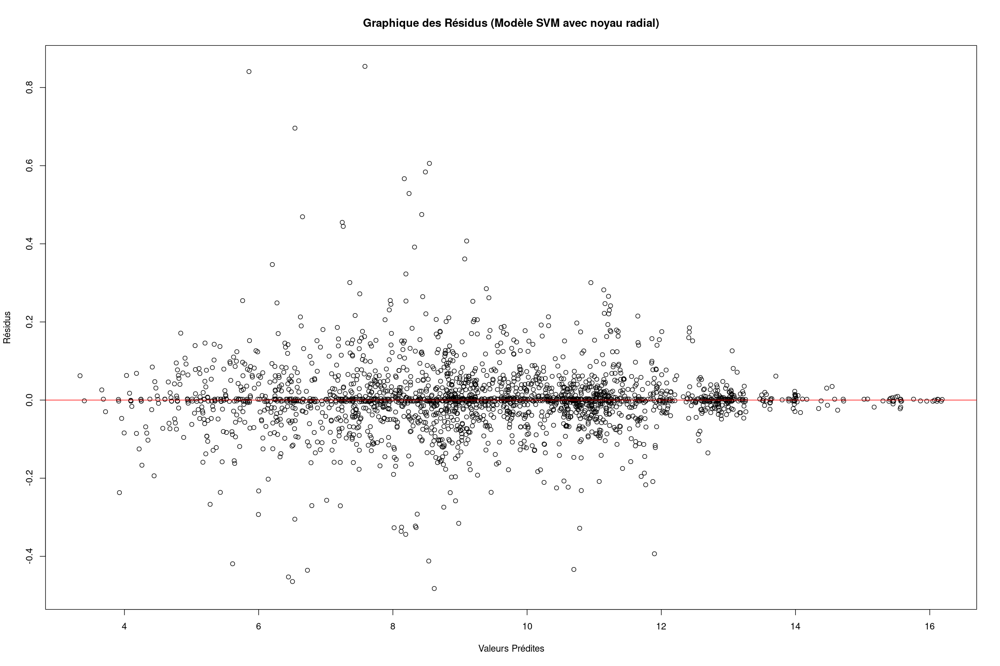

In [59]:
residus_radial <- datappr$Value_co2_emissions_kt_by_country - predictions_radial
plot(predictions_radial, residus_radial,
     xlab = "Valeurs Prédites",
     ylab = "Résidus",
     main = "Graphique des Résidus (Modèle SVM avec noyau radial)")
abline(h = 0, col = "red")  # Ajoute une ligne horizontale à y = 0 pour référence


**Notre noyau radial optimisé a un epsilon = 0.001 et un coût C = 100. La valeur faible du epsilon entraîne une marge très petite. Ainsi, malgré la grande valeur du coût C (peu de points mal classés et donc faible résidus), il est quand même difficile pour les points de se situer à l'intérieur des marges.**

      Poly     Radial     Linear 
0.02366967 0.02096129 0.11282045 


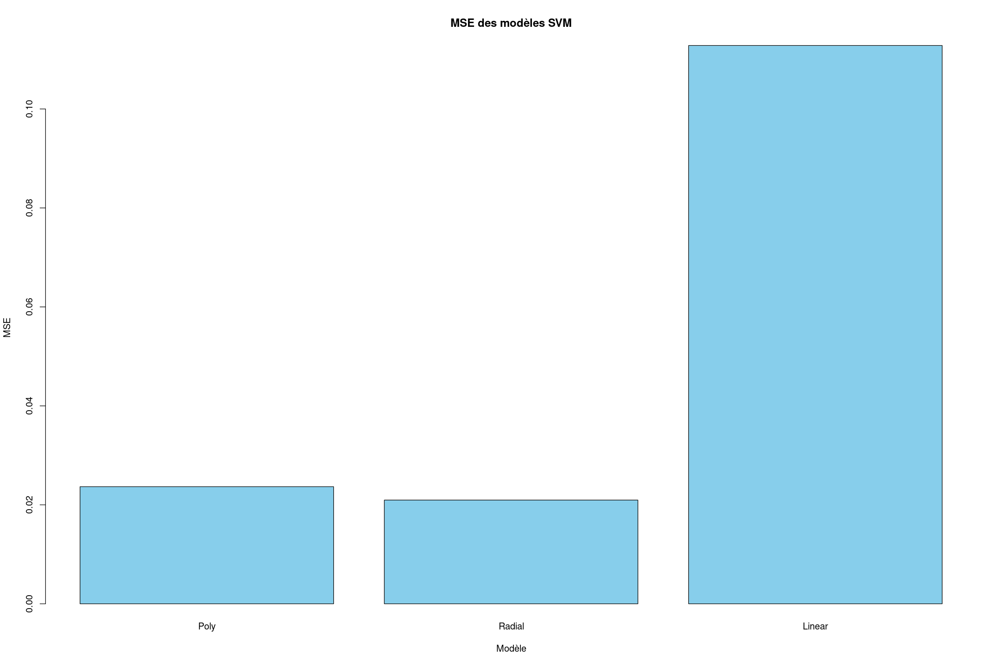

In [80]:

predictions_poly <- predict(svm.reg.poly.tune2, newdata = datestr)
predictions_radial <- predict(svm.reg.rad.tune, newdata = datestr)
predictions_linear <- predict(svm.reg.lin.tune$best.model, newdata= datestr)


mse_linear <- mean((datestr$Value_co2_emissions_kt_by_country - predictions_linear)^2)
mse_poly <- mean((datestr$Value_co2_emissions_kt_by_country - predictions_poly)^2)
mse_radial <- mean((datestr$Value_co2_emissions_kt_by_country - predictions_radial)^2)


print(mse_values)



mse_values <- c("Poly" = mse_poly, "Radial" = mse_radial,"Linear"=mse_linear)
barplot(mse_values, main = "MSE des modèles SVM", xlab = "Modèle", ylab = "MSE", col = "skyblue")




**Pour le noyeau linéaire on retrouve un MSE proche de celui de la régression linéaire. Cependant pour les deux autres noyaux un peu plus complexe , on retrouve un meilleur modèle avec un MSE plutôt bas.Le meilleur noyeau étant le noyeau radial.**

## <span style="color:blue"> IV. 4 - Cart

**La régression avec les arbres de classification et de régression (CART) est une méthode d'apprentissage supervisé utilisée pour la prédiction de valeurs continues..**

**Dans le cas de la régression, nous avons un ensemble de données d'entraînement $\{(x_1, y_1), (x_2, y_2), ..., (x_m, y_m)\}$ où $x_i$ représente les caractéristiques d'un exemple et $y_i$ est la valeur cible correspondante.**

**L'objectif de la régression CART est de construire un arbre de décision qui partitionne l'espace des caractéristiques de manière à minimiser l'erreur de prédiction des valeurs cibles. Chaque nœud de l'arbre divise l'espace en sous-espaces plus petits en fonction d'une règle de partitionnement, généralement basée sur une mesure de pureté comme l'indice de Gini ou l'erreur quadratique moyenne.**

**Mathématiquement, un arbre de régression CART peut être défini par une série de règles de décision basées sur les caractéristiques des données. L'arbre est construit de manière récursive en choisissant à chaque étape la variable de caractéristique et la valeur de seuil qui minimise l'erreur de prédiction.**

**En résumé, la régression avec CART est une méthode flexible et interprétable pour modéliser des relations complexes entre les variables d'entrée et les valeurs de sortie. Elle est particulièrement adaptée aux ensembles de données de grande dimension et peut être efficace même en présence de non-linéarités et d'interactions entre les caractéristiques.**

**Pour cette méthode, le seul hyperparamètre à optimiser est le Cp, représentant la complexité de l'arbre. Plus le Cp augmente, plus on pénalise les divisions de l'arbre et donc plus on a un arbre élagué. On pose comme valeur minimale de Cp 0.0001.**

In [27]:
library(rpart) 
library(rpart.plot)

In [39]:
tree.reg = rpart(Value_co2_emissions_kt_by_country~. - Country - Year, data = datappr, control = rpart.control(cp=0.0001))

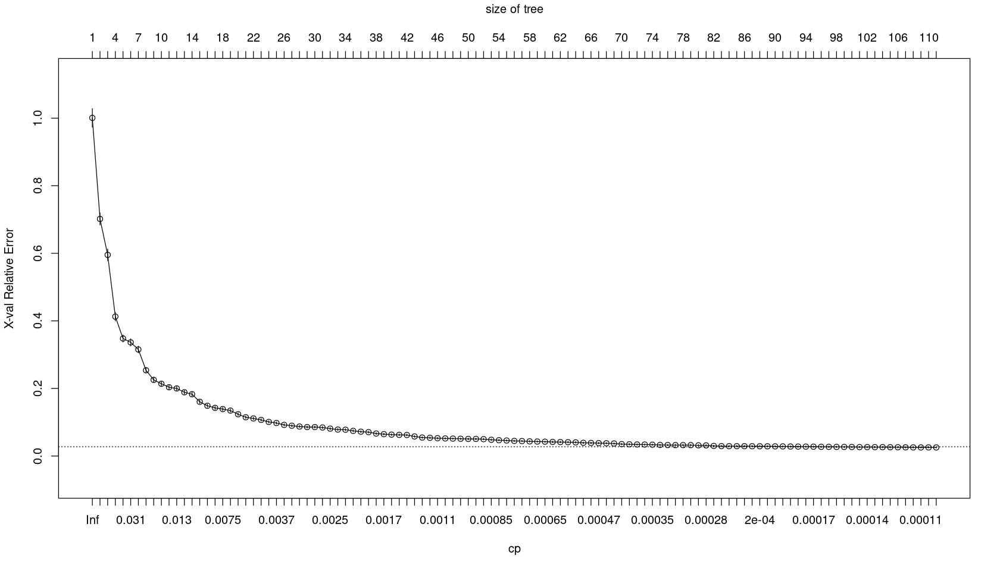

In [40]:
xmat<-xpred.rpart(tree.reg,xval=10) 
CVerr<-apply((xmat-datappr[,"Value_co2_emissions_kt_by_country"])^2,2,sum)
plotcp(tree.reg)

In [41]:
as.numeric(attributes(which.min(CVerr))$names)
tree.reg=rpart(Value_co2_emissions_kt_by_country~. - Country - Year,data=datappr,control=rpart.control(cp=as.numeric(attributes(which.min(CVerr))$names)))

[1] 0.0001049807

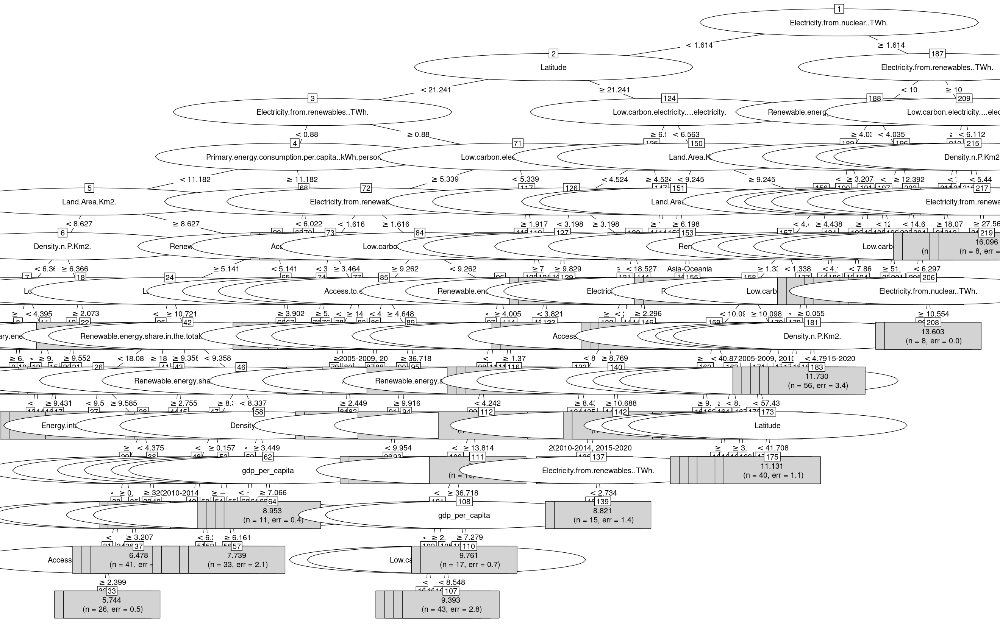

In [42]:
library(partykit)
options(repr.plot.width = 22, repr.plot.height = 14)
plot(as.party(tree.reg), type="simple")

Warning message:
“Removed 6 rows containing missing values (`geom_point()`).”


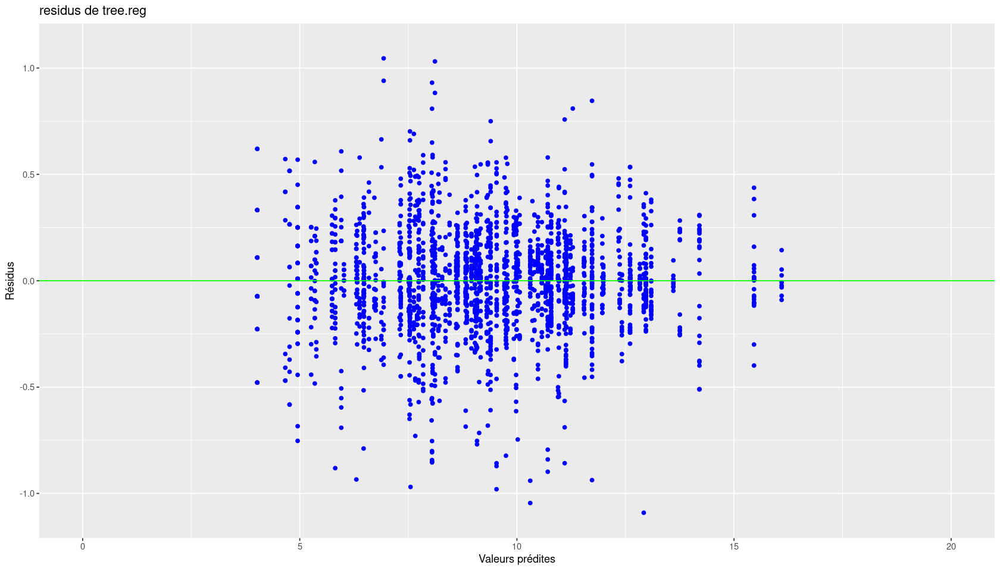

In [43]:
options(repr.plot.width = 14, repr.plot.height = 8)
fit.tree=predict(tree.reg)
res.tree=fit.tree-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.tree,res.tree,"residus de tree.reg")

**La méthode CART nous fournit un modèle bien interprétable, tout comme la régression linéaire. Cependant, elle n'apporte pas une amélioration significative au niveau de la prédiction.Elle est moins précise que la svm par exemple**

**Le graphe des résidus en fonction des valeurs prédites présente une forme verticale caractéristique de la méthode CART.**


In [44]:
# Calcul des prévisions
pred.treer=predict(tree.reg,newdata=datestr)
# Erreur quadratique moyenne de prévision en régression
sum((pred.treer-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.1186679

## <span style="color:blue"> IV. 5 - RandomForest

**La méthode de Random Forest repose sur la combinaison de plusieurs arbres de décision (CART) pour améliorer la prédiction. Cette méthode utilise le bootstrap pour créer plusieurs sous-échantillons des données d'entraînement. Pour créer ces sous-échantillons, on tire avec remise n données ou n correspond à la taille de notre échantillons d'apprentissage de base. L'estimateur final correspond à la moyenne de tous nos estimateurs associés à un échantillon bootstrap : c'est ce qu'on appelle le bagging.Elle va permettre de réduire la variance et améliorer la prédiction finale**

**On peut illustrer l'intêret du bagging avec cet exemple : On souhaite estimer le poids d'un boeuf. On demande à une personne de donner son estimation du poids. L'estimation sera certainement très loin de la réalité. On demande alors à une autre personne, puis encore une autre... de donner leur idée du poids du boeuf. Les estimations prises individuellement seront majoritairement mauvaises. Or, en faisant la moyenne de toutes ces estimations, on s'approche du poids réel du boeuf : l'union fait la force !**

**Cependant, étant donné que les arbres utiliseront pratiquement les mêmes données d'entrainement, la corrélation de ces estimateurs sera élevée (on parle de bootstrap trick). Ainsi, afin de diminuer cette corrélation et donc de diminuer la variance de notre estimateur final, chaque arbre basera sa décision non plus sur le nombre de variables total p mais sur m (généralement = p/3 en régression) variables.**

In [82]:
install.packages("randomForest")
library(randomForest)

Installation du package dans ‘/home/tsall/R/libs’
(car ‘lib’ n'est pas spécifié)

randomForest 4.7-1.1

Type rfNews() to see new features/changes/bug fixes.


Attachement du package : ‘randomForest’


L'objet suivant est masqué depuis ‘package:gridExtra’:

    combine


L'objet suivant est masqué depuis ‘package:dplyr’:

    combine


L'objet suivant est masqué depuis ‘package:ggplot2’:

    margin




In [83]:
rf.reg=randomForest(Value_co2_emissions_kt_by_country~ . - Country - Year, data=datappr,xtest=datestr[,-c(18,2,11)],ytest=datestr[,"Value_co2_emissions_kt_by_country"],
   ntree=500,do.trace=50,mtry = 6,importance=TRUE)
attributes(rf.reg)
rf.reg$mtry

     |      Out-of-bag   |       Test set    |
Tree |      MSE  %Var(y) |      MSE  %Var(y) |
  50 |  0.02345     0.41 |  0.01796     0.31 |
 100 |   0.0202     0.36 |  0.01632     0.28 |
 150 |  0.01868     0.33 |  0.01598     0.28 |
 200 |  0.01798     0.32 |   0.0155     0.27 |
 250 |  0.01746     0.31 |  0.01537     0.26 |
 300 |  0.01743     0.31 |  0.01533     0.26 |
 350 |  0.01747     0.31 |  0.01506     0.26 |
 400 |  0.01745     0.31 |  0.01497     0.26 |
 450 |  0.01752     0.31 |  0.01508     0.26 |
 500 |  0.01736     0.31 |  0.01503     0.26 |


$names
 [1] "call"            "type"            "predicted"       "mse"            
 [5] "rsq"             "oob.times"       "importance"      "importanceSD"   
 [9] "localImportance" "proximity"       "ntree"           "mtry"           
[13] "forest"          "coefs"           "y"               "test"           
[17] "inbag"           "terms"          

$class
[1] "randomForest.formula" "randomForest"

[1] 6

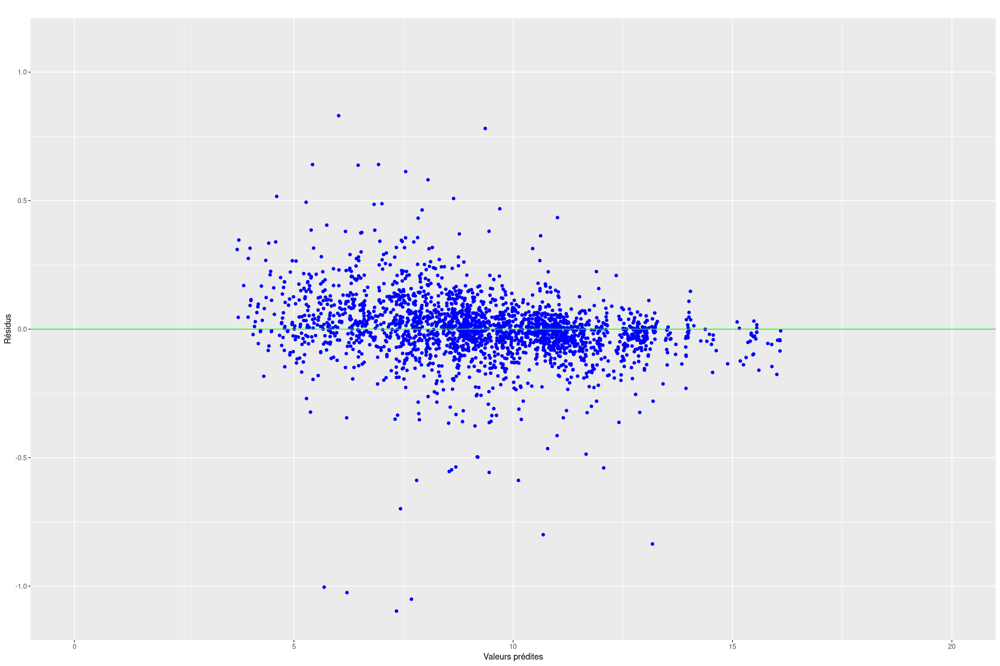

In [84]:
fit.rfr=rf.reg$predicted
res.rfr=fit.rfr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.rfr,res.rfr,titre="")

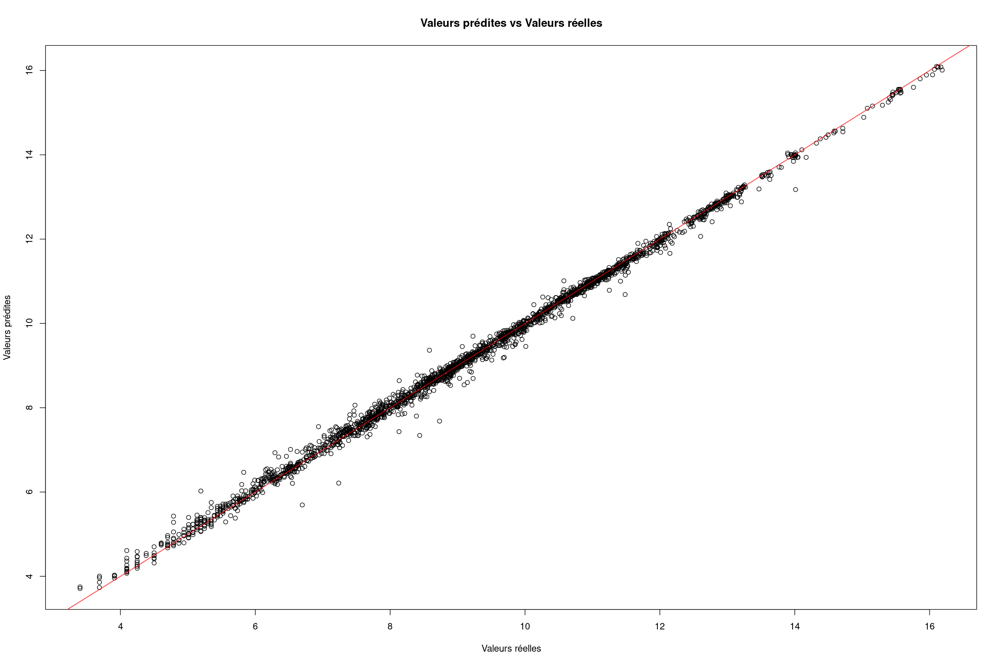

In [85]:

fit.rfr <- rf.reg$predicted


plot(datappr[,"Value_co2_emissions_kt_by_country"], fit.rfr, 
     xlab = "Valeurs réelles", ylab = "Valeurs prédites",
     main = "Valeurs prédites vs Valeurs réelles")

abline(0, 1, col = "red")


Land.Area.Km2. 
                                                           46.10 
                               Electricity.from.renewables..TWh. 
                                                           42.25 
                          Low.carbon.electricity....electricity. 
                                                           41.26 
                                                Density.n.P.Km2. 
                                                           40.21 
                                                       Longitude 
                                                           31.68 
                                                        Latitude 
                                                           31.05 
                                                          Period 
                                                           30.99 
     Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. 
                                                           29.65 
Renewable.energy.share.in.the.total.final.energy.consumption.... 
                                                           29.01 
              Primary.energy.consumption.per.capita..kWh.person. 
                                                           25.19 
                                  Electricity.from.nuclear..TWh. 
                                                           23.15 
                                                  gdp_per_capita 
                                                           20.00 
                               Access.to.clean.fuels.for.cooking 
                                                           18.22 
                         Access.to.electricity....of.population. 
                                                           18.15 
                                                          Entity 
                                                           15.75 
                                                      gdp_growth 
                                                           11.67

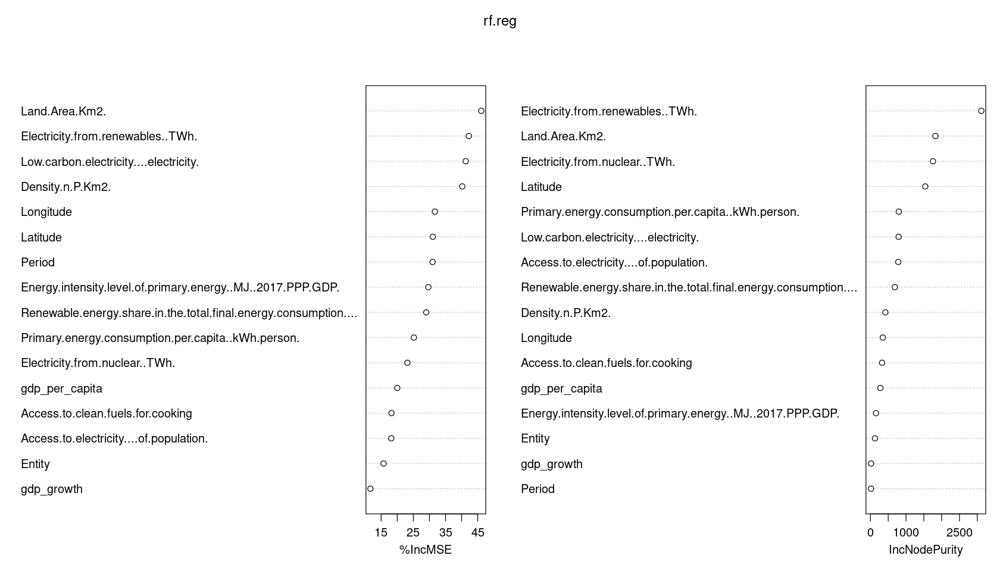

In [62]:
sort(round(importance(rf.reg), 2)[,1], decreasing=TRUE)
varImpPlot(rf.reg)

**On affiche ici deux critères qui permettent d'évaluer l'importance de chacune des variables : Mean Decrease Accuracy (à gauche) et Mean Decrease Impurity (à droite). Dans le graphique ci-dessous, l'importance des variables en fonction du critère Mean Decrease Impurity.**

**Le critère Mean Decrease Accuracy mesure l'importance de chaque variable en termes de réduction de l'exactitude du modèle lorsque cette variable est retirée. Les variables qui réduisent le plus l'exactitude du modèle lorsqu'elles sont retirées sont considérées comme plus importantes.**

**Le critère Mean Decrease Impurity évalue l'importance des variables en termes de réduction de l'impureté des nœuds de l'arbre de décision. Il mesure comment chaque variable contribue à la séparation des classes dans les arbres de décision. Les variables qui réduisent le plus l'impureté des nœuds sont considérées comme plus importantes pour la classification.**

Le chargement a nécessité le package : randomForestSRC


 randomForestSRC 3.2.3 
 
 Type rfsrc.news() to see new features, changes, and bug fixes. 
 



Attachement du package : ‘randomForestSRC’


Les objets suivants sont masqués depuis ‘package:e1071’:

    impute, tune


L'objet suivant est masqué depuis ‘package:purrr’:

    partial




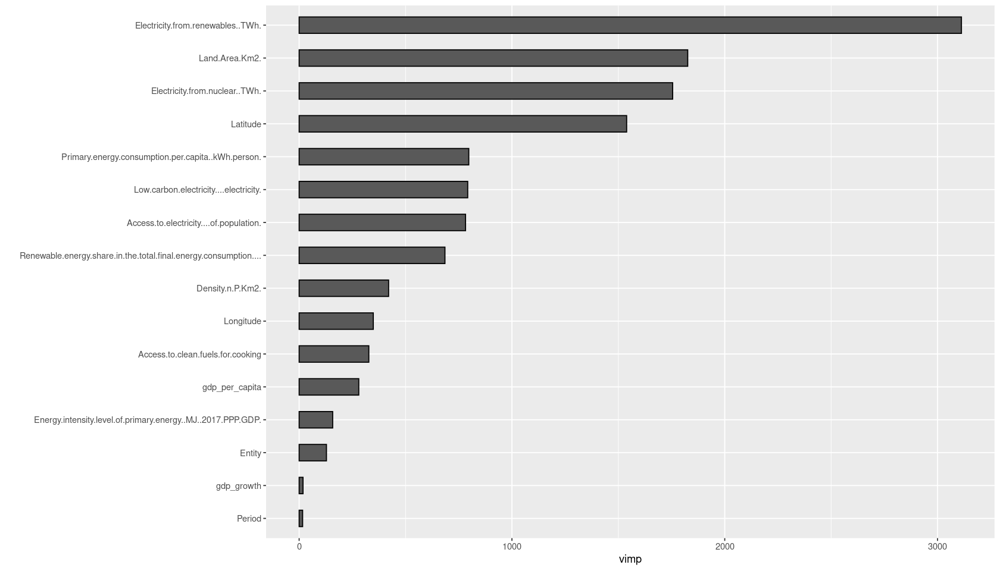

In [63]:
library(ggRandomForests)
plot(gg_vimp(rf.reg))

In [64]:
pred.rfr=rf.reg$test$predicted
sum((pred.rfr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.01481631

**Les variables les plus importantes pour notre modèle Random Forest sont "Electricity from renewables (TWh)", "Land Area", et "Electricity from nuclear (TWh)". Cela signifie que la production d'électricité à partir de sources renouvelables, la latitude géographique et la production d'électricité nucléaire ont le plus grand impact sur nos prédictions.**

**En observant le graphique des résidus par rapport aux valeurs prédites, nous constatons une dispersion uniforme autour de zéro, ce qui indique que nos prédictions sont équilibrées et précises.**

**Cette méthode est moins interprétable que la méthode CART ou la régression linéaire mais fournit le meilleur MSE**

## <span style="color:blue"> IV. 6 - Boosting

**L'idée du Boosting ressemble à celle du Bagging, dans le sens où on fait aussi appel à une série d'estimateurs. Cependant, les algorithmes ne sont plus indépendants. Au contraire, chaque estimateur est entraîné pour corriger les erreurs des estimateurs précédents.**

**On part du jeu de données d'entrainement initial, on crée le premier estimateur. Les observations mal prédites par ce  premier estimateur sont davantage prises en compte pour le calcul de l'estimateur suivant. On répète ce schéma M fois. L'estimateur final est alors le dernier estimateur de la liste, c'est-à-dire "le plus corrigé".**

**Il faudrait optimiser M, correspondant au nombre d'estimateurs utilisés; le taux d'apprentissage ou shrinkage (une petite valeur rendant l'apprentissage plus lent); et le nombre minimum d'observations par feuille. On optimise seulement, toujours par validation croisée (cv.folds = 10), le nombre d'estimateurs utilisés. On prend par contre par défaut 5 comme nombre minimal d'observations par feuille et une valeur intermédiaire (ni trop petite ni trop grande) de shrinkage = 0.03. NB : Afin d'optimiser tous les paramètres, on aurait cependant pu utiliser la librairie caret (que nous ne pouvons pas utiliser dans ce projet).**

In [66]:
install.packages("gbm")
library(gbm)

Installation du package dans ‘/home/apommier/R/libs’
(car ‘lib’ n'est pas spécifié)

Warning message in install.packages("gbm"):
“l'installation du package ‘gbm’ a eu un statut de sortie non nul”
Loaded gbm 2.1.9

This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3



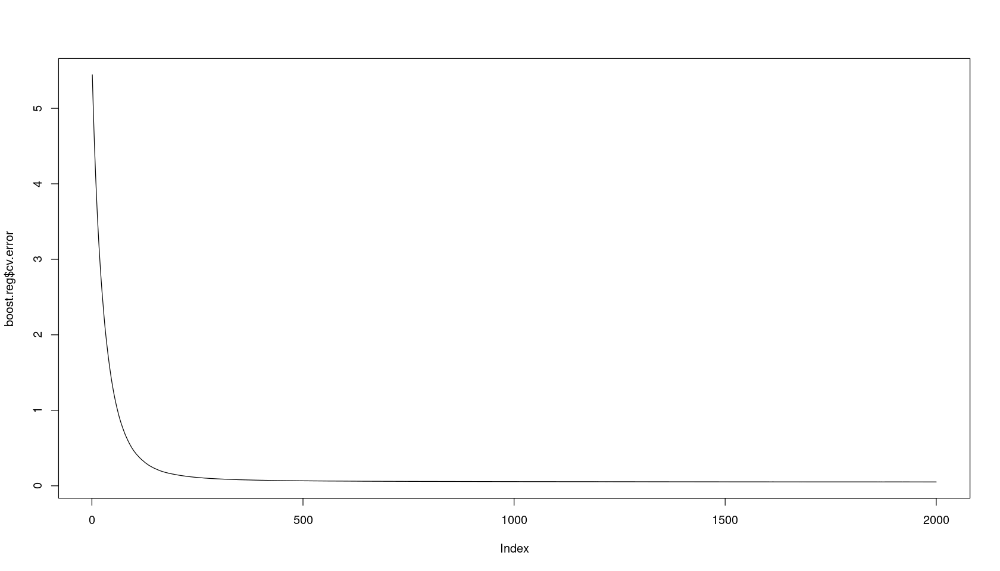

In [86]:
boost.reg = gbm(Value_co2_emissions_kt_by_country ~ . - Entity - Period, data = datappr, distribution = "gaussian", n.trees = 2000, 
    cv.folds = 10, n.minobsinnode = 5, shrinkage = 0.03, verbose = FALSE)
plot(boost.reg$cv.error, type = "l")

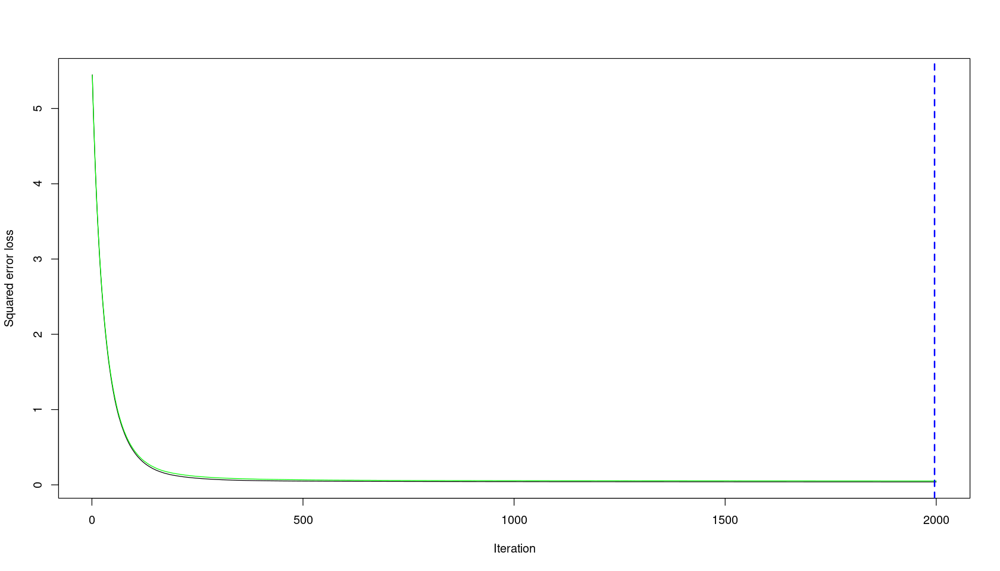

In [82]:
best.iter=gbm.perf(boost.reg,method="cv")

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


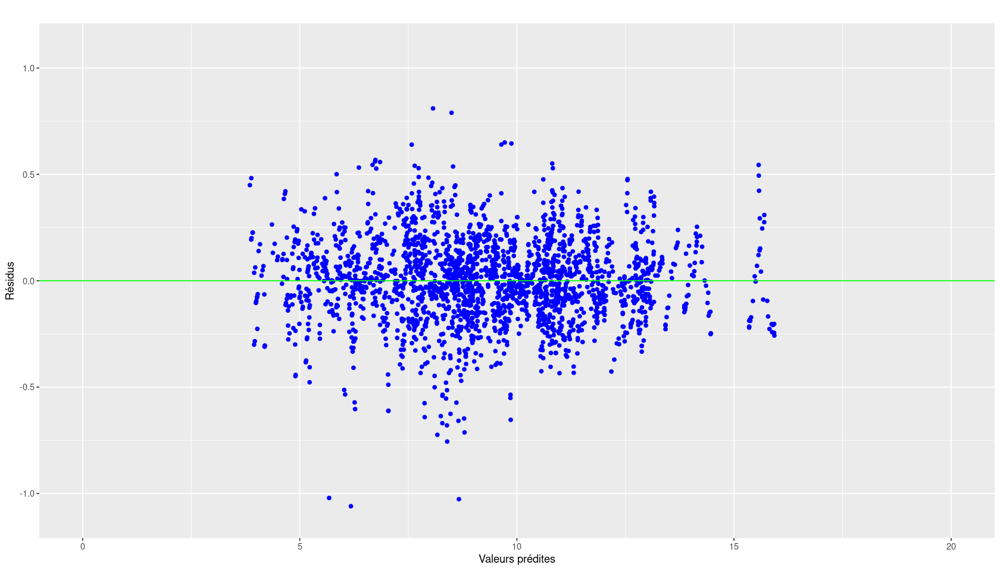

In [87]:
fit.boostr=boost.reg$fit
res.boostr=fit.boostr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.boostr,res.boostr,titre="")

In [88]:
pred.boostr=predict(boost.reg,newdata=datestr,n.trees=best.iter)
sum((pred.boostr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.04665747

**On obtient une erreur de généralisation de 0.047.Le boosting n'est pas meilleur que la méthode du svm, les MSE sont assez proches.Mais le paramétrage de la SVM est couteux en temps. Alors que le boosting est relativement rapide**

## <span style="color:blue"> IV. 7 - Réseaux de Neurones

**Un réseau de neurones est organisé en plusieurs couches : une couche d'entrée, possiblement plusieurs couches cachées et une couche de sortie. On utilise ici qu'une seule couche cachée. La couche d'entrée contient le même nombre de neurones que le nombre de variables p. Dans le cas de la régression, la couche de sortie ne contient qu'un seul neurone contenant la prédiction du réseau de neurones. Enfin, les poids et biais des neurones des différentes couches sont ajustés de manière itérative, à l'aide d'algorithme d'optimisation poussés (backpropagation).**

**Les paramètres que nous devons optimiser sont : le nombre de neurones dans la couche cachée, le nombre d'époques (correspondant au nombre de fois que l'on parcourt toutes les données d'entrainement), la taille du batch m ( un batch étant un morceau des données d'entrainement), et le taux d'apprentissage. En ce qui concerne la fonction d'activation, on utilise la fonction identité dans le cas de la régression.**

**Ici, nous utilisons la librairie nnet, qui n'utilise pas de batch (voit toutes les données en une seule fois).**

In [46]:
library(MASS)
library(nnet)


Attachement du package : ‘MASS’


L'objet suivant est masqué depuis ‘package:plotly’:

    select


L'objet suivant est masqué depuis ‘package:dplyr’:

    select




,size,decay
,<dbl>,<int>
6,8,2


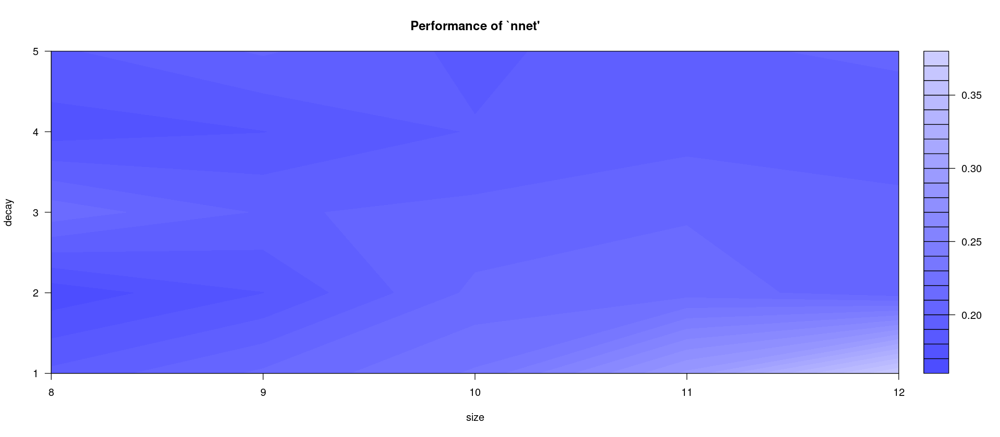

In [19]:
library(e1071)
# learning rate : indirectement contrôlé par decay (force de pénalisation)
# nnet utilise maxit pour le nombre d'époques max, étant donné que toutes les observations vues en une seule fois
# taille du batch = n
# on choisit maxit = 1000 (pour assurer la convergence de l'algorithme)
# size : nombre de neurones dans la couche cachée
## nb observations (ici environ 2300) = 10 * nombre de poids (donc environ 230 poids)
neur.tune = tune.nnet(Value_co2_emissions_kt_by_country ~ . - Country - Year,data=datappr,size=c(8,9,10,11,12),decay=1:5,maxit=1000,linout=TRUE)
plot(neur.tune)
neur.tune$best.parameters

# weights:  177
initial  value 206446.792818 
iter  10 value 9316.258852
iter  20 value 7374.794764
iter  30 value 6391.957216
iter  40 value 5940.844146
iter  50 value 5662.241546
iter  60 value 5193.554390
iter  70 value 4628.071375
iter  80 value 4009.396573
iter  90 value 3154.872734
iter 100 value 2783.421189
iter 110 value 2529.837957
iter 120 value 2356.625759
iter 130 value 2194.407786
iter 140 value 1965.532465
iter 150 value 1716.988714
iter 160 value 1543.356604
iter 170 value 1461.444245
iter 180 value 1350.929063
iter 190 value 1227.812934
iter 200 value 1145.381066
iter 210 value 1084.600121
iter 220 value 1014.902761
iter 230 value 924.742995
iter 240 value 828.589375
iter 250 value 758.842317
iter 260 value 658.420768
iter 270 value 604.466410
iter 280 value 557.982724
iter 290 value 511.122500
iter 300 value 483.574066
iter 310 value 460.593197
iter 320 value 446.912069
iter 330 value 435.319493
iter 340 value 427.093321
iter 350 value 416.880648
iter 360 value 398.519

Warning message:
“Removed 3 rows containing missing values (`geom_point()`).”


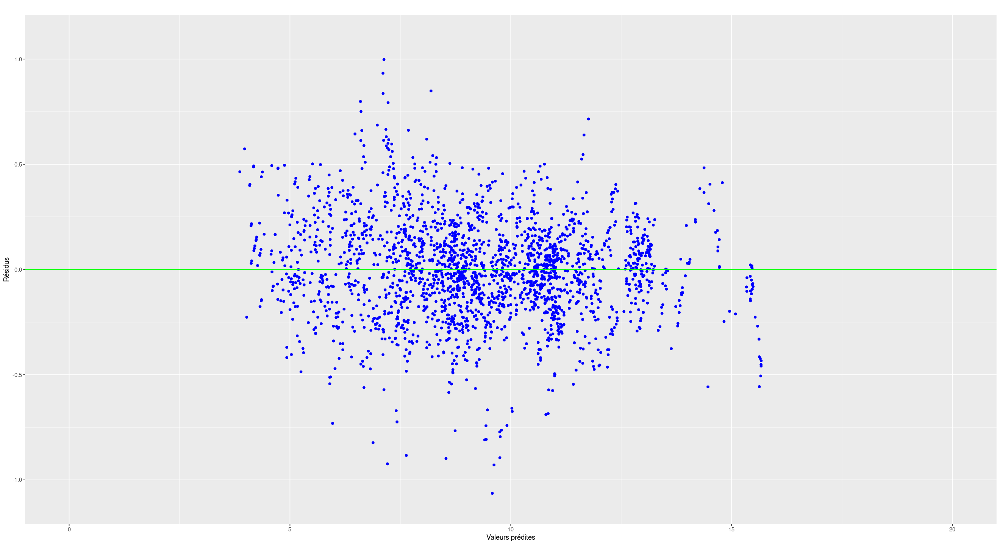

In [135]:
nnet.reg=nnet(Value_co2_emissions_kt_by_country~ . - Country - Year,data=datappr,size=8,decay=2,linout=TRUE,maxit=1000)
# calcul et graphe des résidus
fit.nnetr=predict(nnet.reg,data=datappr)
res.nnetr=fit.nnetr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.nnetr,res.nnetr,titre="")

In [136]:
# Calcul des prévisions
pred.nnetr=predict(nnet.reg,newdata=datestr)
# Erreur quadratique moyenne de prévision
sum((pred.nnetr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.06593754

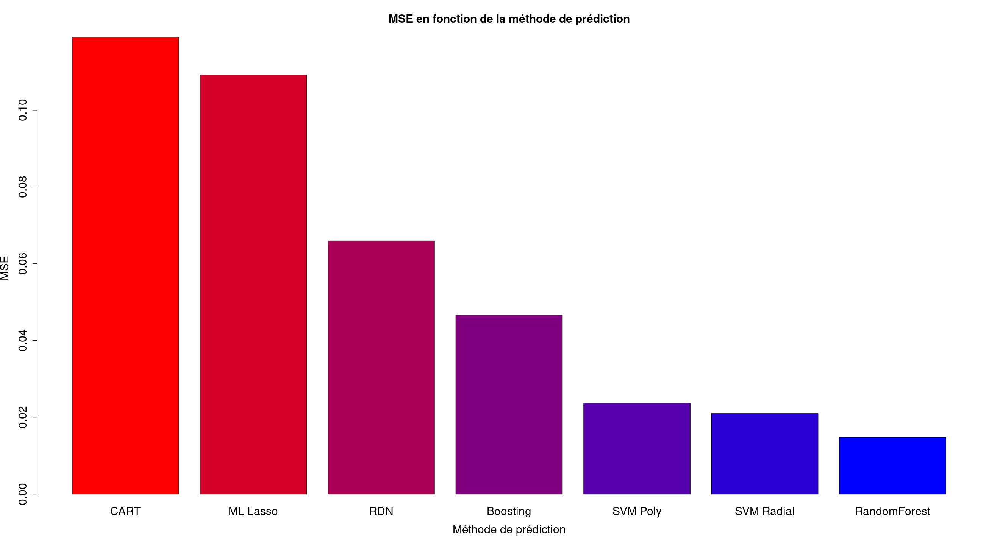

In [138]:
mse = c(0.118968428996318,0.109188119677148,0.0659375413080726,0.0466574668812723,0.0236696744420613,0.0209612912215569,0.0148163094162032)
labels <- c("CART", "ML Lasso", "RDN", "Boosting", "SVM Poly", "SVM Radial", "RandomForest")
colors <- colorRampPalette(c("red", "blue"))(length(mse))
barplot(mse,
        main = "MSE en fonction de la méthode de prédiction",
        cex.main = 1.5,
        xlab = "Méthode de prédiction",
        ylab = "MSE",
        col = colors,
        names.arg = labels,
        cex.lab = 1.5,          
        cex.names = 1.5,
        cex.axis = 1.5) 

**Le réseau de neurone est une méthode moins interprétable que le randomforest et moins précisque le svm dans notre cas avec notre échantillon test.Le paramétrage est rapide relativement à la méthode SVM pour la taille des vecteurs qu'on a.**

# <span style="color:blue"> V - Retour sur analyse descriptive

**Vérifions désormais que nos résultats sont cohérents avec l’analyse exploratoire des données, notamment en ce qui concerne l’importance des variables. Pour cela, on décide de s'appuyer sur les résultats issus de la méthode Random Forest. En effet, c'est avec cette méthode de prédiction que nous obtenons la meilleure erreur de généralisation. De plus, cette méthode a l'avantage d'être interprétable concernant la pertinence des variables sur la prédiction de Value_co2_emissions_kt_by_country. On réaffiche alors le Mean Decrease Impurity ou MDI : une variable avec un grand MDI étant alors considérée comme importante.**

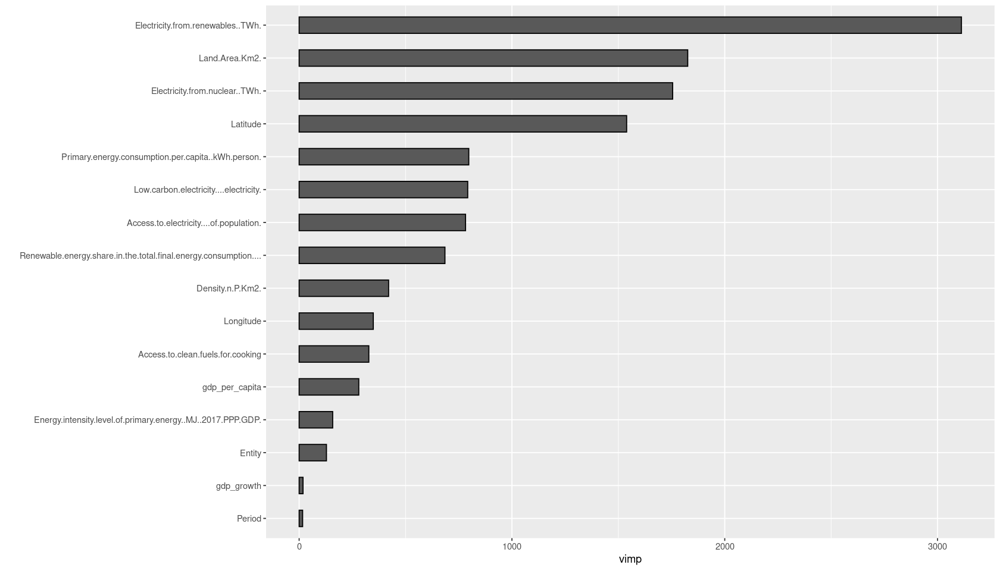

In [111]:
plot(gg_vimp(rf.reg))

**On voit donc que les variables les plus significatives pour prédire la variable Value_co2_emissions_kt_by_country selon le MDI dans l'ordre : Electricity.from.renewables..TWh, Land.Area.Km2 et Electricity.from.nuclear..TWh. Ces résultat là sont alors conformes à nos analyses descriptives. En effet, lors de l'acp et graph des corrélations, on remarquait que la variables à prédire était à la fois corrélée avec des variables représentant le niveau de richesse d'un pays (Electricity.from.renewables..TWh,Electricity.from.nuclear..TWh), ainsi qu'à la variable indiquant la superficie du pays (Land.Area.Km2). Les trois variables dernièrement citées sont alors celles qui permettent le mieux d'expliquer Value_co2_emissions_kt_by_country.**

**Il nous semble alors cohérent de dire que les pays émettant le plus de CO2 semblent être les plus riches (pouvant se permettre d'utiliser des énergies renouvelables mais ne les utilisant pas en grande part) et/ou ceux ayant une grande superficie.**

# <span style="color:blue"> VI - Complétion de données manquantes

In [54]:
energy <- read.table("energy.txt", sep = ",", header = TRUE)
head(energy)
summary(energy)
dim(energy)

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.electricity.generating.capacity.per.capita,Financial.flows.to.developing.countries..US...,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,⋯,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,Renewables....equivalent.primary.energy.,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


    Entity               Year      Access.to.electricity....of.population.
 Length:3649        Min.   :2000   Min.   :  1.252                        
 Class :character   1st Qu.:2005   1st Qu.: 59.801                        
 Mode  :character   Median :2010   Median : 98.362                        
                    Mean   :2010   Mean   : 78.934                        
                    3rd Qu.:2015   3rd Qu.:100.000                        
                    Max.   :2020   Max.   :100.000                        
                                   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

[1] 3649   21

In [55]:
# Conversion de la variable Year en facteur
energy$Year <- as.factor(energy$Year)
# Conversion de la variable Density en variable numérique
energy$Density.n.P.Km2. <- as.numeric(gsub(",", "", energy$Density.n.P.Km2.))

In [56]:
energy[, "Access.to.electricity....of.population."] <- sqrt(energy[, "Access.to.electricity....of.population."])
energy[, "Access.to.clean.fuels.for.cooking"] <- sqrt(energy[, "Access.to.clean.fuels.for.cooking"])
energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."] <- sqrt(energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."])
energy[, "Electricity.from.fossil.fuels..TWh."] <- sqrt(energy[, "Electricity.from.fossil.fuels..TWh."])
energy[, "Electricity.from.nuclear..TWh."] <- sqrt(energy[, "Electricity.from.nuclear..TWh."])
energy[, "Electricity.from.renewables..TWh."] <- sqrt(energy[, "Electricity.from.renewables..TWh."])
energy[, "Low.carbon.electricity....electricity."] <- sqrt(energy[, "Low.carbon.electricity....electricity."])
energy[, "Primary.energy.consumption.per.capita..kWh.person."] <- sqrt(energy[, "Primary.energy.consumption.per.capita..kWh.person."])
energy[, "Value_co2_emissions_kt_by_country"] <- log(energy[, "Value_co2_emissions_kt_by_country"])
energy[, "gdp_per_capita"] <- log(energy[, "gdp_per_capita"])
energy[, "Density.n.P.Km2."] <- log(energy[, "Density.n.P.Km2."])
energy[, "Land.Area.Km2."] <- log(energy[, "Land.Area.Km2."])

In [57]:
energy$Country <- as.factor(energy$Entity)
energy$Entity <- as.factor(energy$Entity)
energy$Entity <- fct_collapse(energy$Entity,
  "Europe" = c("Albania","Austria","Belgium","Belarus","Bosnia and Herzegovina","Bulgaria","Croatia","Cyprus","Czechia","Denmark","Estonia","Moldova","Finland","France","Germany","Greece","Hungary","Iceland","Serbia","Portugal","Ireland","Turkey","Italy","Latvia","Lithuania","Luxembourg","Malta","Netherlands","Norway","Poland","Portugal","Montenegro","Romania","Serbia","Slovakia","Slovenia","Spain","Sweden","Switzerland","United Kingdom","Ukraine"),
  "America" = c("Cayman Islands","Bahamas","Saint Kitts and Nevis","Saint Vincent and the Grenadines","Saint Lucia","Puerto Rico","Bermuda","Aruba","Barbados","Guyana","Grenada","Dominica","Cuba","Costa Rica","Belize","Antigua and Barbuda","Ecuador","Argentina","Brazil","Canada","Chile","Colombia","Mexico","Haiti","Honduras","Jamaica","Paraguay","Venezuela","Peru","Uruguay","United States","Bolivia","Suriname","El Salvador","Panama","Nicaragua","Guatemala"),
  "Asia-Oceania" = c("Tuvalu","Nauru","Maldives","Kiribati","Bhutan","Bahrain","China","Afghanistan","Armenia","Azerbaijan","Bangladesh","Cambodia","Australia","Dominican Republic","Egypt","Hong Kong","Pakistan","New Zealand","Taiwan","United Arab Emirates","Thailand","South Korea","Philippines","Saudi Arabia","Singapore","India","Indonesia","Iran","Israel","Japan","Malaysia","Fiji","Gabon","Georgia","Iraq","Jordan","Kazakhstan","Kuwait","Kyrgyzstan","Laos","Lebanon","Lesotho","Libya","Madagascar","Malawi","Mauritania","Mauritius","Mongolia","Mozambique","Myanmar","Namibia","Nepal","North Macedonia","Oman","Papua New Guinea","Qatar","Samoa","Seychelles","Sierra Leone","Solomon Islands","Sri Lanka","Syria","Tajikistan","Tanzania","Timor-Leste","Tonga","Trinidad and Tobago","Tunisia","Turkmenistan","Uzbekistan","Vanuatu","Vietnam","Yemen"),
  "Africa" = c("New Caledonia","French Guiana","Algeria","Angola","Benin","Botswana","Burkina Faso","Burundi","Burundi","Cabo Verde","Cameroon","Central African Republic","Cameroon","Central African Republic","Nigeria","Equatorial Guinea","South Africa","Eritrea","Ethiopia","Chad","Comoros","Congo","Djibouti","Chad","Comoros","Congo","Democratic Republic of Congo","Djibouti","Egypt","Equatorial Guinea","Gambia","Guinea","Guinea-Bissau","Kenya","Ghana","Eritrea","Eswatini","Ethiopia","Liberia","Gabon","Gambia","Ghana","Mali","Guinea","Guinea-Bissau","Kenya","Lesotho","Morocco","Liberia","Libya","Madagascar","Niger","Malawi","Mali","Mauritania","Mauritius","Senegal","Morocco","Rwanda","Mozambique","Namibia","Somalia","Sudan","Niger","Nigeria","Togo","Rwanda","Sao Tome and Principe","Senegal","Seychelles","Uganda","Sierra Leone","Somalia","South Africa","South Sudan","Zambia","Zimbabwe","Sudan","Tanzania","Togo","Tunisia","Uganda","Zambia","Zimbabwe")
)
head(energy)
energy$Period <- fct_collapse(energy$Year, "2000-2004" = c("2000","2001","2002","2003","2004"), "2005-2009" = c("2005","2006","2007","2008","2009"),
                            "2010-2014" = c("2010","2011","2012","2013","2014"), "2015-2020" = c("2015","2016","2017","2018","2019","2020"))       
print(table(energy$Entity))
str(energy)

Warning message:
“Unknown levels in `f`: Moldova, Venezuela, Bolivia, Hong Kong, Taiwan, South Korea, Iran, Laos, Syria, Tanzania, Timor-Leste, Vietnam, Cabo Verde, Democratic Republic of Congo, Tanzania”


,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.electricity.generating.capacity.per.capita,Financial.flows.to.developing.countries..US...,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,⋯,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,Renewables....equivalent.primary.energy.,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude,Country
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,Asia-Oceania,2000,1.270272,2.489980,9.22,20000,6.707459,0.4000000,0,0.5567764,⋯,1.64,6.633318,NA,NA,NA,4.094345,13.38815,33.93911,67.70995,Afghanistan
2,Asia-Oceania,2001,2.018557,2.683282,8.86,130000,6.752777,0.3000000,0,0.7071068,⋯,1.74,6.593045,NA,NA,NA,4.094345,13.38815,33.93911,67.70995,Afghanistan
3,Asia-Oceania,2002,3.067435,2.863564,8.47,3950000,6.150610,0.3605551,0,0.7483315,⋯,1.40,6.937314,NA,NA,5.189766,4.094345,13.38815,33.93911,67.70995,Afghanistan
4,Asia-Oceania,2003,3.839076,3.082207,8.09,25970000,6.054750,0.5567764,0,0.7937254,⋯,1.40,7.106606,NA,8.832278,5.250617,4.094345,13.38815,33.93911,67.70995,Afghanistan
5,Asia-Oceania,2004,4.479394,3.301515,7.75,NA,6.651316,0.5744563,0,0.7483315,⋯,1.20,6.937314,NA,1.414118,5.353667,4.094345,13.38815,33.93911,67.70995,Afghanistan
6,Asia-Oceania,2005,5.038938,3.492850,7.51,9830000,5.820653,0.5830952,0,0.7681146,⋯,1.41,7.346010,NA,11.229715,5.489067,4.094345,13.38815,33.93911,67.70995,Afghanistan



Asia-Oceania       Europe       Africa      America 
        1071          784         1059          735 
'data.frame':	3649 obs. of  23 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Year                                                            : Factor w/ 21 levels "2000","2001",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Access.to.electricity....of.population.                         : num  1.27 2.02 3.07 3.84 4.48 ...
 $ Access.to.clean.fuels.for.cooking                               : num  2.49 2.68 2.86 3.08 3.3 ...
 $ Renewable.electricity.generating.capacity.per.capita            : num  9.22 8.86 8.47 8.09 7.75 7.51 7.4 7.25 7.49 7.5 ...
 $ Financial.flows.to.developing.countries..US...                  : num  20000 130000 3950000 25970000 NA ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.71 6.75 6.15 6.05 6.65 ...
 $ Electricity.from.fossil.fuels..TWh.     

In [58]:
#energy$Type <- factor(energy$Type, levels = c("=","--","-","+","++"))
# Suppression de la varible Renewable.electricity.generating.capacity.per.capita
energy <- subset(energy, select = -Renewable.electricity.generating.capacity.per.capita)
# Suppression de la variable Financial.flows.to.developing.countries..US...
energy <- subset(energy, select = -Financial.flows.to.developing.countries..US...)
# Suppression de la variable Renewables....equivalent.primary.energy.
energy <- subset(energy, select =  -Renewables....equivalent.primary.energy.)
energy <- subset(energy, select = -Year)
energy <- subset(energy, select = -Country)
energy <- subset(energy, select = -Electricity.from.fossil.fuels..TWh.)
str(energy)

'data.frame':	3649 obs. of  17 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Access.to.electricity....of.population.                         : num  1.27 2.02 3.07 3.84 4.48 ...
 $ Access.to.clean.fuels.for.cooking                               : num  2.49 2.68 2.86 3.08 3.3 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.71 6.75 6.15 6.05 6.65 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.557 0.707 0.748 0.794 0.748 ...
 $ Low.carbon.electricity....electricity.                          : num  8.12 9.21 9.01 8.19 7.93 ...
 $ Primary.energy.consumption.per.capita..kWh.person.              : num  17.4 15.4 14.5 15.2 14.3 ...
 $ Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.     : num  1.64 1.74 1.4 1.4 1.2 1.41 1.5 1.

In [59]:
missing_data <- colMeans(is.na(energy)) * 100

# Trier les résultats par ordre décroissant
sorted_missing_data <- sort(missing_data, decreasing = TRUE)

# Afficher les résultats de manière propre
cat("Pourcentage de données manquantes par variable (ordre décroissant):\n")
for (i in seq_along(sorted_missing_data)) {
  cat(names(sorted_missing_data)[i], ": ", sprintf("%.2f", sorted_missing_data[i]), "%\n")
}
head(energy)

Pourcentage de données manquantes par variable (ordre décroissant):
Value_co2_emissions_kt_by_country :  11.73 %
gdp_growth :  8.69 %
gdp_per_capita :  7.73 %
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. :  5.67 %
Renewable.energy.share.in.the.total.final.energy.consumption.... :  5.32 %
Access.to.clean.fuels.for.cooking :  4.63 %
Electricity.from.nuclear..TWh. :  3.45 %
Low.carbon.electricity....electricity. :  1.15 %
Electricity.from.renewables..TWh. :  0.58 %
Access.to.electricity....of.population. :  0.27 %
Density.n.P.Km2. :  0.03 %
Land.Area.Km2. :  0.03 %
Latitude :  0.03 %
Longitude :  0.03 %
Entity :  0.00 %
Primary.energy.consumption.per.capita..kWh.person. :  0.00 %
Period :  0.00 %


,Entity,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude,Period
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,Asia-Oceania,1.270272,2.489980,6.707459,0,0.5567764,8.121419,17.39525,1.64,6.633318,NA,NA,4.094345,13.38815,33.93911,67.70995,2000-2004
2,Asia-Oceania,2.018557,2.683282,6.752777,0,0.7071068,9.205746,15.39129,1.74,6.593045,NA,NA,4.094345,13.38815,33.93911,67.70995,2000-2004
3,Asia-Oceania,3.067435,2.863564,6.150610,0,0.7483315,9.008853,14.52109,1.40,6.937314,NA,5.189766,4.094345,13.38815,33.93911,67.70995,2000-2004
4,Asia-Oceania,3.839076,3.082207,6.054750,0,0.7937254,8.186653,15.16470,1.40,7.106606,8.832278,5.250617,4.094345,13.38815,33.93911,67.70995,2000-2004
5,Asia-Oceania,4.479394,3.301515,6.651316,0,0.7483315,7.932298,14.29095,1.20,6.937314,1.414118,5.353667,4.094345,13.38815,33.93911,67.70995,2000-2004
6,Asia-Oceania,5.038938,3.492850,5.820653,0,0.7681146,7.964977,15.87668,1.41,7.346010,11.229715,5.489067,4.094345,13.38815,33.93911,67.70995,2005-2009


**On affiche ici des représentations graphiques permettant de situer les données manquantes parmi le jeu de données initial.**

Le chargement a nécessité le package : colorspace


Attachement du package : ‘colorspace’


L'objet suivant est masqué depuis ‘package:pROC’:

    coords


VIM is ready to use.


Suggestions and bug-reports can be submitted at: https://github.com/statistikat/VIM/issues


Attachement du package : ‘VIM’


L'objet suivant est masqué depuis ‘package:datasets’:

    sleep





 Variables sorted by number of missings: 
                                                         Variable        Count
                                Value_co2_emissions_kt_by_country 0.1172924089
                                                       gdp_growth 0.0868731159
                                                   gdp_per_capita 0.0772814470
      Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. 0.0567278706
 Renewable.energy.share.in.the.total.final.energy.consumption.... 0.0531652508
                                Access.to.clean.fuels.for.cooking 0.0463140586
                                   Electricity.from.nuclear..TWh. 0.0345300082
                           Low.carbon.electricity....electricity. 0.0115100027
                                Electricity.from.renewables..TWh. 0.0057550014
                          Access.to.electricity....of.population. 0.0027404768
                                                 Density.n.P.Km2. 0.0002740477
         

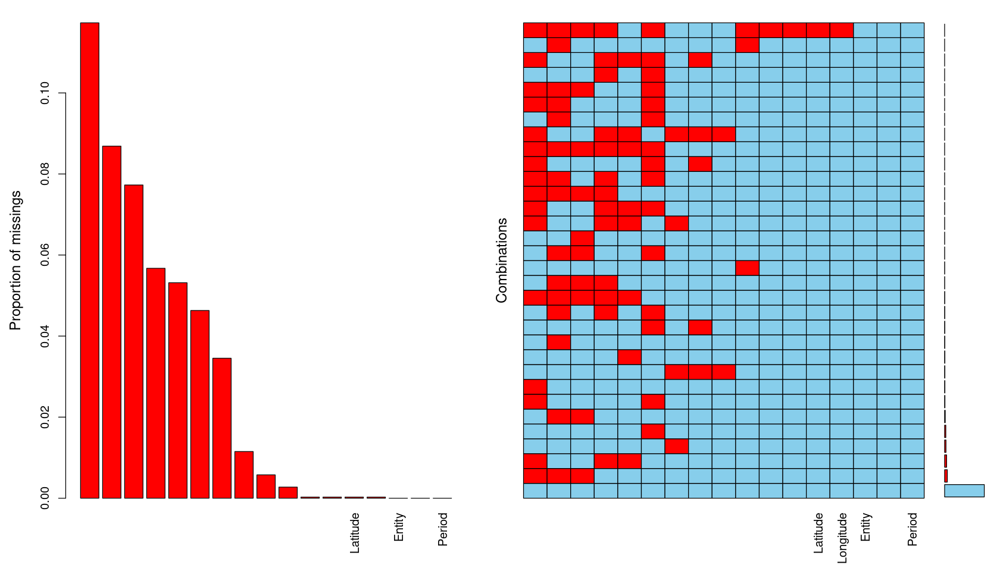

In [60]:
library(VIM)
res<-summary(aggr(energy, sortVar=TRUE))$combinations

In [61]:
library(missForest)


Attachement du package : ‘missForest’


L'objet suivant est masqué depuis ‘package:VIM’:

    nrmse




**Pour compléter les données manquantes, on décide d'utiliser l'algorithme MissForest. Cet algorithme s'appuie sur des forêts aléatoires (Random Forest).**

**En particulier, l'algorithme complète d'abord les données manquantes de chaque variable par une approche naïve (valeur moyenne des données observées). Il classe alors dans une matrice les variables les variables contenant le plus de données manquantes jusqu'à celles en contenant le moins.**

**Puis, tant qu'un critère de convergence n'est pas atteint, on décide de compléter les données manquantes de chaque variable grâce à la méthode RandomForest (RF). On traite d'abord la variable Y1 contenant le plus de données manquantes. On entraine le modèle d'apprentissage RF grâce au jeu de données contentant les individus pour lesquels on a des valeurs observées sur la variables Y1. Puis, on prédit les valeurs manquantes de Y1 à l'aide de ce modèle (et grâce cette fois-ci aux individus pour lesquels on a des valeurs manquantes su la variable Y1).**

In [62]:
energyImp=missForest(energy)

In [63]:
energyImp <- energyImp$ximp
class(energyImp)
summary(energyImp)
str(energyImp)

[1] "data.frame"

          Entity     Access.to.electricity....of.population.
 Asia-Oceania:1071   Min.   : 1.119                         
 Europe      : 784   1st Qu.: 7.690                         
 Africa      :1059   Median : 9.913                         
 America     : 735   Mean   : 8.604                         
                     3rd Qu.:10.000                         
                     Max.   :10.000                         
 Access.to.clean.fuels.for.cooking
 Min.   : 0.000                   
 1st Qu.: 5.089                   
 Median : 9.220                   
 Mean   : 7.351                   
 3rd Qu.:10.000                   
 Max.   :10.000                   
 Renewable.energy.share.in.the.total.final.energy.consumption....
 Min.   :0.000                                                   
 1st Qu.:2.588                                                   
 Median :4.866                                                   
 Mean   :4.918                                                  

'data.frame':	3649 obs. of  17 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Access.to.electricity....of.population.                         : num  1.27 2.02 3.07 3.84 4.48 ...
 $ Access.to.clean.fuels.for.cooking                               : num  2.49 2.68 2.86 3.08 3.3 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.71 6.75 6.15 6.05 6.65 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.557 0.707 0.748 0.794 0.748 ...
 $ Low.carbon.electricity....electricity.                          : num  8.12 9.21 9.01 8.19 7.93 ...
 $ Primary.energy.consumption.per.capita..kWh.person.              : num  17.4 15.4 14.5 15.2 14.3 ...
 $ Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.     : num  1.64 1.74 1.4 1.4 1.2 1.41 1.5 1.

In [64]:
any_miss <- any(is.na(energyImp))
any_miss
sum(is.na(energyImp) == TRUE)

[1] FALSE

[1] 0

**On vérifie bien que le jeu de données ne contient plus de données manquantes.**

In [65]:
set.seed(111) # initialisation du générateur
# Extraction des échantillons
test.ratio <- .2   # part de l'échantillon test
npop <- nrow(energyImp) # nombre de lignes
nvar <- ncol(energyImp) # nombre de colonnes
# taille de l'échantillon test
ntest <- ceiling(npop * test.ratio) 
# indices de l'échantillon test
testi <- sample(1:npop, ntest)
# indices de l'échantillon d'apprentissage
appri <- setdiff(1:npop, testi) 
### pour CO2 emissions
datappr <- energyImp[appri,] 
# construction de l'échantillon test
datestr <- energyImp[testi,] 
# vérification
str(datappr)
str(datestr)complète

'data.frame':	2919 obs. of  17 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Access.to.electricity....of.population.                         : num  1.27 2.02 3.07 4.48 5.04 ...
 $ Access.to.clean.fuels.for.cooking                               : num  2.49 2.68 2.86 3.3 3.49 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.71 6.75 6.15 6.65 5.82 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.557 0.707 0.748 0.748 0.768 ...
 $ Low.carbon.electricity....electricity.                          : num  8.12 9.21 9.01 7.93 7.96 ...
 $ Primary.energy.consumption.per.capita..kWh.person.              : num  17.4 15.4 14.5 14.3 15.9 ...
 $ Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.     : num  1.64 1.74 1.4 1.2 1.41 1.5 1.53 1

In [66]:
gplot.res <- function(x, y, titre = "titre"){
    ggplot(data.frame(x=x, y=y),aes(x,y))+
    geom_point(col = "blue")+xlim(0, 20)+ylim(-1.1, 1.1)+
    ylab("Résidus")+ xlab("Valeurs prédites")+
    ggtitle(titre)+
    geom_hline(yintercept = 0,col="green")
}

**On décide de tester sur le jeu de données complet les trois alogrithmes suivants (faisant partie des plus performants lors de notre dernière analyse) :**

SVM Polynomial

Random Forest

Réseau de Neurones.

## <span style="color:blue"> VI. 1 - SVM

In [67]:
library(e1071)

In [17]:
svm.reg.poly.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Entity - Period, type = "eps-regression", data = datappr, kernel = "poly", cost = c(1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5), coef0 = 0:8, gamma = seq(0.02, 0.1, by = 0.02))
summary(svm.reg.poly.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 gamma coef0 cost
  0.08     2  1.5

- best performance: 0.03719773 

- Detailed performance results:
    gamma coef0 cost      error  dispersion
1    0.02     0  1.0 1.57397102 1.151682316
2    0.04     0  1.0 0.68129725 0.797974779
3    0.06     0  1.0 0.39477726 0.459620817
4    0.08     0  1.0 0.32634228 0.459941303
5    0.10     0  1.0 0.28787654 0.458994665
6    0.02     1  1.0 0.17009684 0.332697229
7    0.04     1  1.0 0.12372467 0.236011629
8    0.06     1  1.0 0.06100977 0.060394218
9    0.08     1  1.0 0.04187800 0.012945759
10   0.10     1  1.0 0.04065795 0.015042286
11   0.02     2  1.0 0.16226506 0.314497598
12   0.04     2  1.0 0.15190430 0.326378693
13   0.06     2  1.0 0.05230482 0.035295882
14   0.08     2  1.0 0.03875427 0.005523977
15   0.10     2  1.0 0.04451011 0.028107436
16   0.02     3  1.0 0.14957473 0.276002017
17   0.04     3  1.0 0.15590876 0.339552434
18   0.06   

In [71]:
svm.reg.poly.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Entity - Period, type = "eps-regression", data = datappr, kernel = "poly", epsilon = c(0.001, 0.01, 0.1, 1), gamma = 0.08, coef0 = 2, cost = 1.5)
summary(svm.reg.poly.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 gamma coef0 cost epsilon
  0.08     2  1.5     0.1

- best performance: 0.04281941 

- Detailed performance results:
  gamma coef0 cost epsilon      error dispersion
1  0.08     2  1.5   0.001 0.09013191 0.18540700
2  0.08     2  1.5   0.010 0.09582779 0.20499786
3  0.08     2  1.5   0.100 0.04281941 0.01012024
4  0.08     2  1.5   1.000 1.52026534 0.09576794


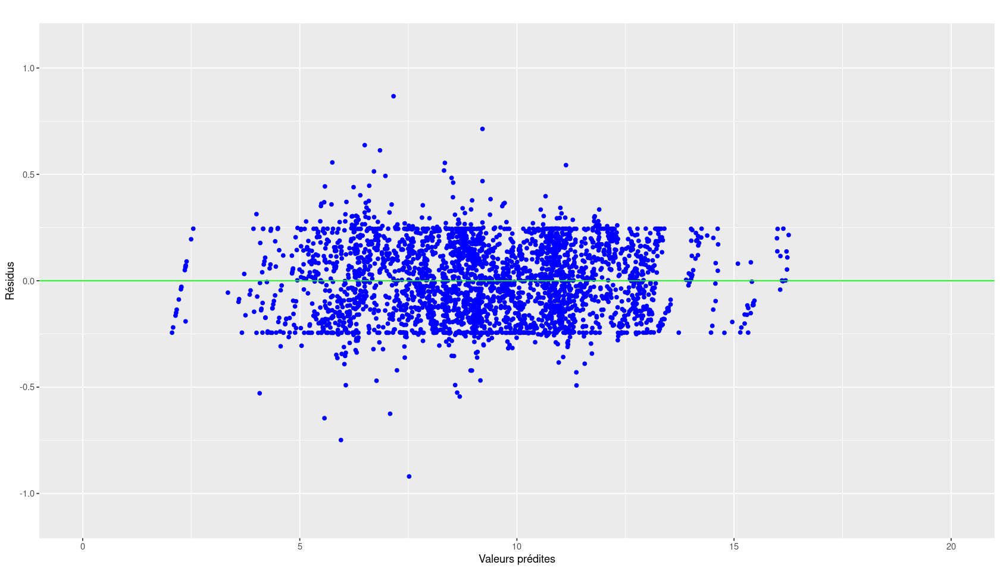

In [72]:
fit.svmr=svm.reg.poly.tune$best.model$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [73]:
pred.svmr.poly.tune = predict(svm.reg.poly.tune$best.model, newdata = datestr)
paste("Tuned polynomial kernel:",sum((pred.svmr.poly.tune-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")

[1] "Tuned polynomial kernel: 0.0389821692430197"

## <span style="color:blue"> VI. 2 - Random Forest

In [74]:
library(randomForest)

In [94]:
rf.reg=randomForest(Value_co2_emissions_kt_by_country~., data=datappr,xtest=datestr[,-10],ytest=datestr[,"Value_co2_emissions_kt_by_country"],
   ntree=500,do.trace=50,importance=TRUE)
attributes(rf.reg)
rf.reg$mtry

     |      Out-of-bag   |       Test set    |
Tree |      MSE  %Var(y) |      MSE  %Var(y) |
  50 |  0.02355     0.40 |  0.02319     0.39 |
 100 |  0.01869     0.31 |  0.01967     0.33 |
 150 |  0.01715     0.29 |  0.01914     0.32 |
 200 |  0.01611     0.27 |  0.01937     0.33 |
 250 |  0.01594     0.27 |   0.0193     0.32 |
 300 |   0.0153     0.26 |  0.01899     0.32 |
 350 |  0.01502     0.25 |  0.01852     0.31 |
 400 |  0.01487     0.25 |  0.01836     0.31 |
 450 |  0.01503     0.25 |  0.01855     0.31 |
 500 |  0.01486     0.25 |  0.01856     0.31 |


$names
 [1] "call"            "type"            "predicted"       "mse"            
 [5] "rsq"             "oob.times"       "importance"      "importanceSD"   
 [9] "localImportance" "proximity"       "ntree"           "mtry"           
[13] "forest"          "coefs"           "y"               "test"           
[17] "inbag"           "terms"          

$class
[1] "randomForest.formula" "randomForest"

[1] 5

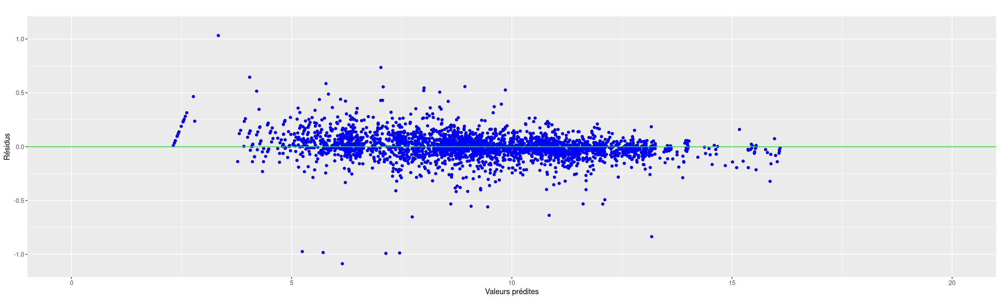

In [95]:
fit.rfr=rf.reg$predicted
res.rfr=fit.rfr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.rfr,res.rfr,titre="")

In [98]:
# Forêts aléatoires
pred.rfr=rf.reg$test$predicted
# Erreur quadratique moyenne de prévision
sum((pred.rfr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.01855626

## <span style="color:blue"> VI. 3 - Réseaux de Neurones

In [37]:
library(MASS)
library(nnet)
# apprentissage
# attention au paramètre linout dans le cas de la régression
nnet.reg=nnet(Value_co2_emissions_kt_by_country ~ . ,data=datappr,size=15,decay=1,linout=TRUE,maxit=500) 
summary(nnet.reg)

# weights:  346
initial  value 344539.519736 
iter  10 value 12719.669645
iter  20 value 11253.619973
iter  30 value 9434.863988
iter  40 value 7735.565495
iter  50 value 6490.735537
iter  60 value 5873.292003
iter  70 value 5482.742984
iter  80 value 5153.056369
iter  90 value 4903.537714
iter 100 value 4761.335787
iter 110 value 4103.333999
iter 120 value 3469.588193
iter 130 value 3099.900981
iter 140 value 2818.086479
iter 150 value 2336.055613
iter 160 value 2064.389365
iter 170 value 1889.701787
iter 180 value 1537.452444
iter 190 value 1216.490978
iter 200 value 1071.218006
iter 210 value 890.529647
iter 220 value 773.311818
iter 230 value 677.076456
iter 240 value 574.852585
iter 250 value 497.982594
iter 260 value 448.049806
iter 270 value 405.242121
iter 280 value 380.149503
iter 290 value 351.942193
iter 300 value 334.420004
iter 310 value 320.148019
iter 320 value 305.435668
iter 330 value 295.239947
iter 340 value 285.828189
iter 350 value 279.317596
iter 360 value 274.331

a 21-15-1 network with 346 weights
options were - linear output units  decay=1
  b->h1  i1->h1  i2->h1  i3->h1  i4->h1  i5->h1  i6->h1  i7->h1  i8->h1  i9->h1 
  -0.32   -0.06    0.17    0.80    0.20    0.03   -0.03    0.03    0.20   -0.01 
i10->h1 i11->h1 i12->h1 i13->h1 i14->h1 i15->h1 i16->h1 i17->h1 i18->h1 i19->h1 
  -0.31    0.34   -0.58   -0.06    0.03   -0.16   -0.36   -0.05    0.13    0.06 
i20->h1 i21->h1 
  -0.31   -0.38 
  b->h2  i1->h2  i2->h2  i3->h2  i4->h2  i5->h2  i6->h2  i7->h2  i8->h2  i9->h2 
  -0.31   -0.05    0.10   -0.27   -0.14    0.57    0.44    0.03    0.00    0.00 
i10->h2 i11->h2 i12->h2 i13->h2 i14->h2 i15->h2 i16->h2 i17->h2 i18->h2 i19->h2 
  -0.08    0.32    0.05   -0.14   -0.05    0.17    0.01    0.23    0.00    0.08 
i20->h2 i21->h2 
   0.06    0.09 
  b->h3  i1->h3  i2->h3  i3->h3  i4->h3  i5->h3  i6->h3  i7->h3  i8->h3  i9->h3 
  -0.20    0.10    0.34   -0.22   -0.09   -0.09   -0.05    0.09    0.12    0.00 
i10->h3 i11->h3 i12->h3 i13->h3 i14->h3 i15

,size,decay
,<dbl>,<int>
5,14,1


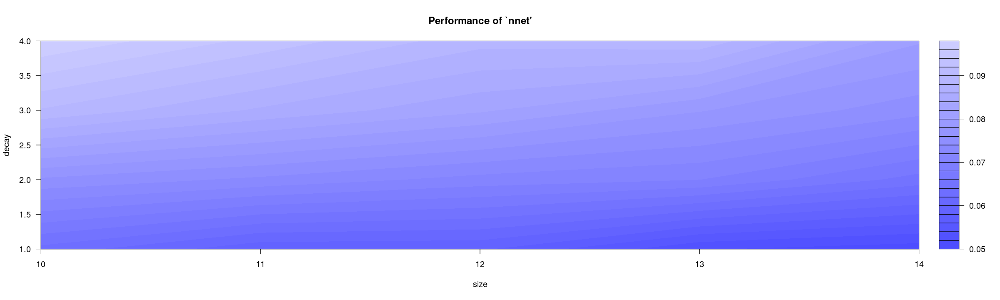

In [99]:
library(e1071)
neur.tune = tune.nnet(Value_co2_emissions_kt_by_country ~ . ,data=datappr,size=c(10,11,12,13,14),decay=1:4,maxit=500,linout=TRUE)
plot(neur.tune)
neur.tune$best.parameters

# weights:  309
initial  value 146816.085728 
iter  10 value 14695.410406
iter  20 value 13100.531707
iter  30 value 11269.376469
iter  40 value 8800.027016
iter  50 value 7034.499296
iter  60 value 6311.180737
iter  70 value 5871.454384
iter  80 value 5513.982602
iter  90 value 5295.986444
iter 100 value 5155.669731
iter 110 value 4958.381216
iter 120 value 4752.809960
iter 130 value 4513.899728
iter 140 value 4252.963065
iter 150 value 4001.025819
iter 160 value 3767.942555
iter 170 value 3530.873089
iter 180 value 3340.304495
iter 190 value 3109.702157
iter 200 value 2854.812290
iter 210 value 2498.983863
iter 220 value 2130.019748
iter 230 value 1810.327466
iter 240 value 1524.008204
iter 250 value 1283.240489
iter 260 value 1054.683458
iter 270 value 888.424545
iter 280 value 776.644362
iter 290 value 683.076227
iter 300 value 587.208188
iter 310 value 523.691205
iter 320 value 476.693404
iter 330 value 437.901387
iter 340 value 407.563811
iter 350 value 383.522000
iter 360 value 

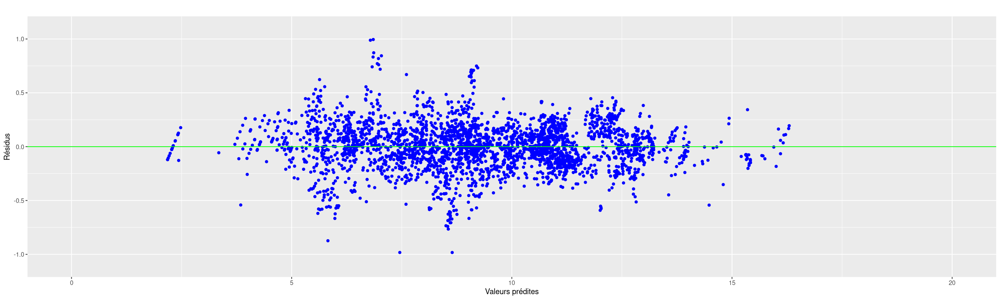

In [100]:
nnet.reg=nnet(Value_co2_emissions_kt_by_country~ .,data=datappr,size=14,decay=1,linout=TRUE,maxit=500)
# calcul et graphe des résidus
fit.nnetr=predict(nnet.reg,data=datappr)
res.nnetr=fit.nnetr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.nnetr,res.nnetr,titre="")

In [104]:
# Calcul des prévisions
pred.nnetr=predict(nnet.reg,newdata=datestr)
# Erreur quadratique moyenne de prévision
sum((pred.nnetr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.05071609

# <span style="color:blue"> Résultats 

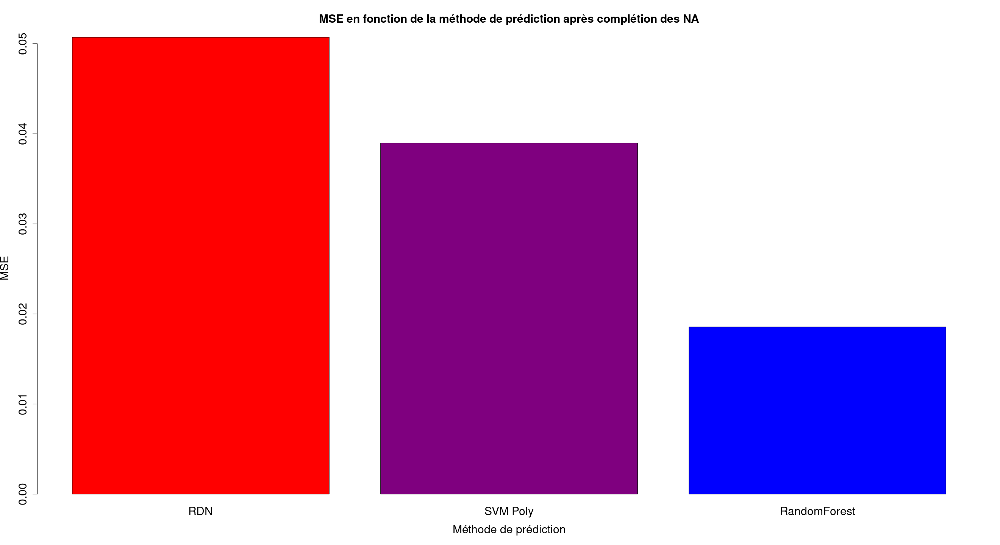

In [117]:
options(repr.plot.width = 22, repr.plot.height = 12)
mse = c(0.0507160943454593, 0.0389821692430197, 0.0185562622897947)
labels <- c("RDN", "SVM Poly", "RandomForest")
colors <- colorRampPalette(c("red", "blue"))(length(mse))
barplot(mse,
        main = "MSE en fonction de la méthode de prédiction après complétion des NA",
        cex.main = 1.5,       
        xlab = "Méthode de prédiction",
        ylab = "MSE",
        col = colors,
        names.arg = labels,
        cex.lab = 1.5,          
        cex.names = 1.5,
        cex.axis = 1.5)        

#### On constate que la meilleure méthode reste celle de Random Forest. Après l'utilisation de l'algorithme de complétion des données manquantes MissForest, les performances de prédiction pour RDN, SVM et RandomForest restent à peu près les mêmes.

# <span style="color:blue"> Conclusion

**Notre étude du jeu de données "Energy" a révélé les facteurs influençant les émissions de CO2 de 176 pays entre 2000 et 2020. En testant divers modèles d'apprentissage automatique, tels que les modèles linéaires, les SVM, les arbres de décision (CART), Random Forest, les réseaux de neurones et le Boosting, nous avons identifié les variables les plus significatives pour prédire les émissions de CO2 par pays. Parmi tous les modèles évalués, Random Forest s'est avéré le plus précis, indépendamment de la présence de données manquantes.**